In [1]:
from Signal_Class import Signal_data as sd

In [2]:
import numpy as np

In [3]:
file_name = "/datax/scratch/kai_mul/BreakthroughAutoencoder/Data/HIP13402/HIP13402_data.npy"
data_shape_name = file_name.replace(".npy", "_shape.npy")
data_shape = np.load(data_shape_name)
data_shape = tuple(int(dim) for dim in data_shape)

data = np.memmap(file_name, dtype="float32", mode="r+", shape=data_shape)
frequencies = np.load("/datax/scratch/kai_mul/BreakthroughAutoencoder/Data/HIP13402/Hip13402_data_frequency.npy")

In [4]:
print(f"{data.shape=}, {frequencies.shape=}")

data.shape=(77693, 6, 16, 4096), frequencies.shape=(77693, 4096)


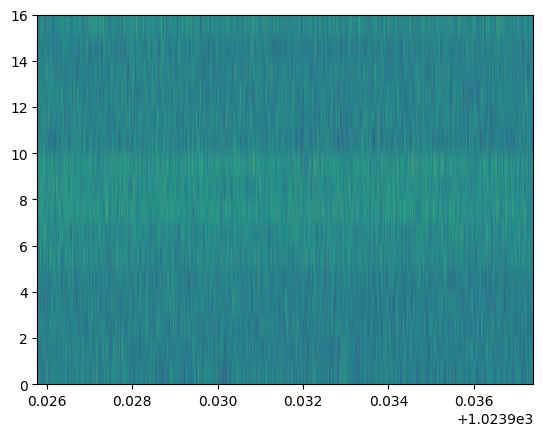

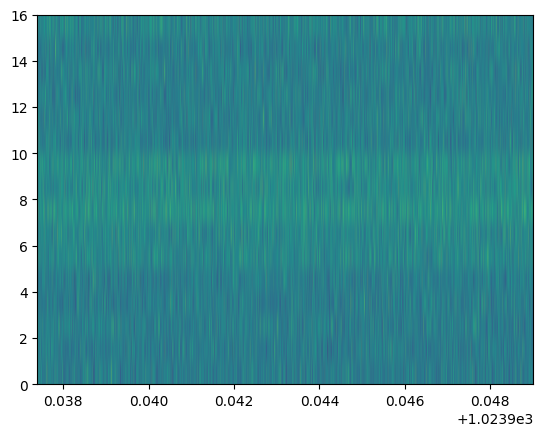

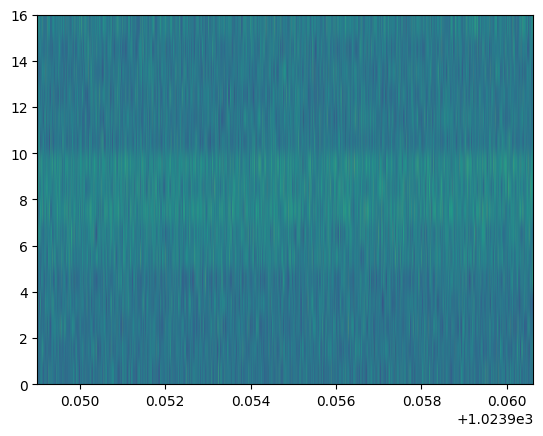

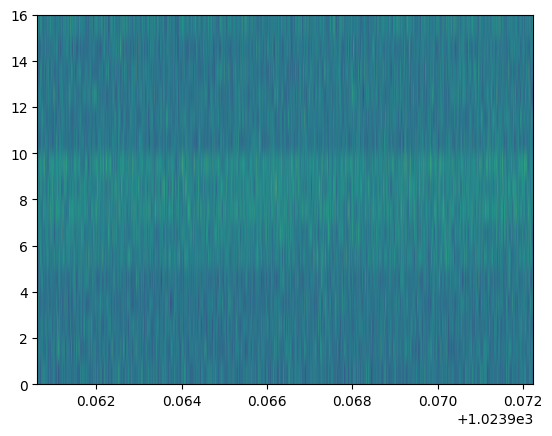

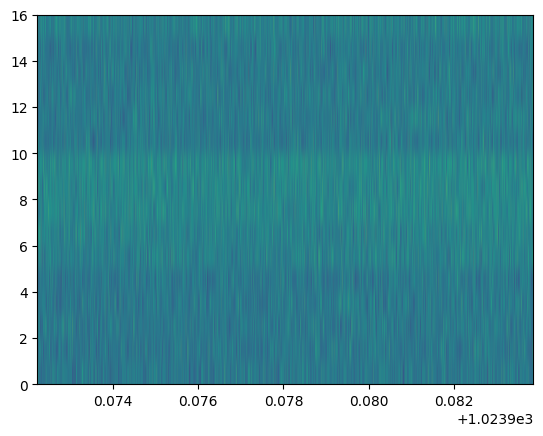

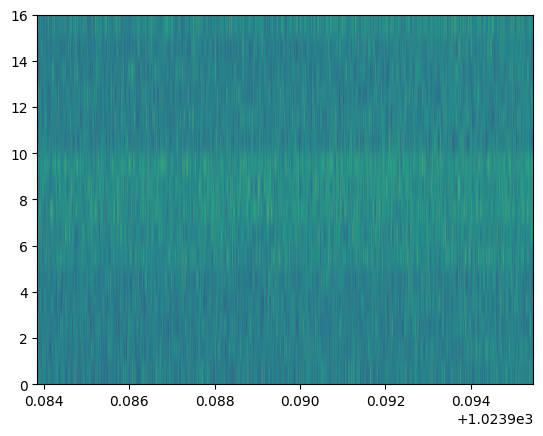

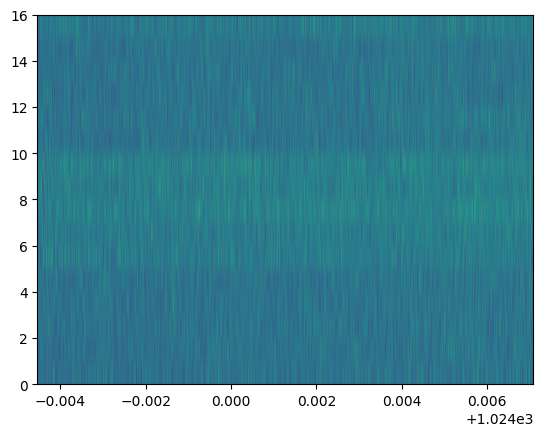

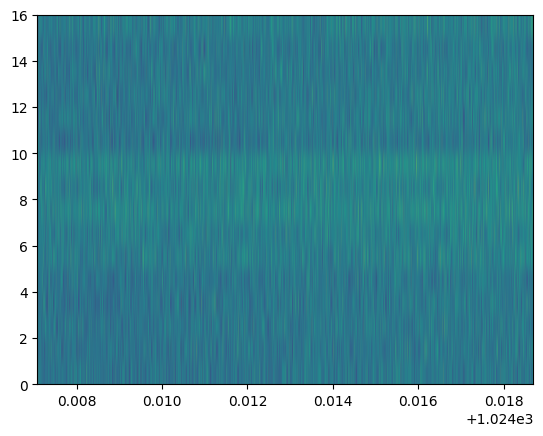

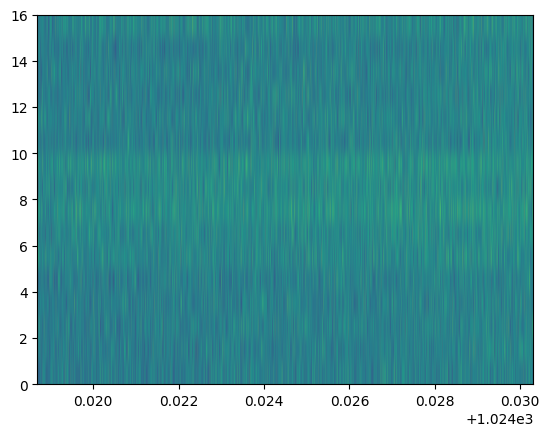

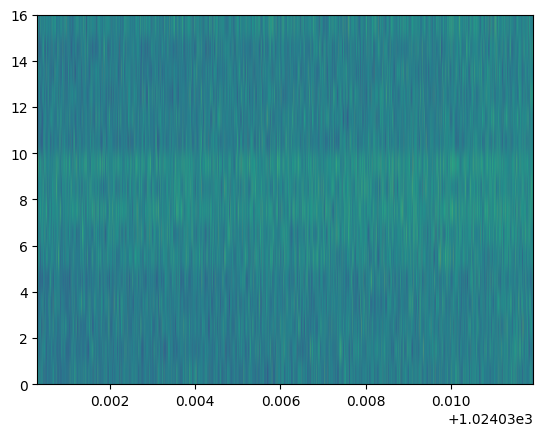

In [5]:
import matplotlib.pyplot as plt

for i in range(10):
    unique_id = np.array((i,0))
    plt.imshow(data[unique_id[0], unique_id[1], :, :], origin="lower", aspect="auto",
            extent=[frequencies[unique_id[0]][0], frequencies[unique_id[0]][-1], 0, data.shape[2]])
    plt.show()

    #x axis is frequency
    # frequency_for_zero = frequencies[0]
    # plt.xticks(frequency_for_zero)

testing_snippet = data[unique_id[0], unique_id[1], :, :]

In [6]:
10/0.02

500.0

In [8]:
import time
from tqdm import tqdm
"""

is_there_signal_map = np.zeros((data.shape[0], data.shape[1]))
signal_instance_array = np.zeros((data.shape[0], data.shape[1]), dtype=object)

for i in tqdm(range(10_000)):
    save_bool = False
    signal_found_list = []
    for j in range(6):
        unique_id = np.array((i, j))
        testing_snippet = data[unique_id[0], unique_id[1], :, :]

        # start_time = time.perf_counter()
        signal_instance = sd(
            testing_snippet, sigma_multiplier=3.0, unique_id=unique_id
        )

        grown_signal = signal_instance.Consolidated_methods(
            maximum_gap=20,
            max_vertical_gap=1,
            drift_padding_gap=5,
            min_neighbours=4,
            gate_requirment_for_false="and",
            growth_threshold_above_median=0,
            silence_bool=True,
        )
        #if the sum of points in the grown signal is greater than 0, plot the results
        if np.sum(grown_signal) > 0:
            # print(f"Unique ID: {unique_id}")
            # print("now plotting the consolidated seeds:")
            # signal_instance.plot_1D(
            #     mask_type="consolidated",
            #     save_location=None,
            #     show_plot_bool=True,
            # )
            # print("now plotting the grown seeds:")
            # signal_instance.plot_1D(
            #     mask_type="grown",
            #     save_location=None,
            #     show_plot_bool=True,
            # )
            # print("now plotting the consolidated seeds in 2D:")
            # signal_instance.plot_2D(
            #     mask_type="grown",
            #     save_location=None,
            #     show_plot_bool=True,
            # )
            is_there_signal_map[unique_id[0], unique_id[1]] = 1
            save_bool = True
            signal_found_list.append(unique_id[1])
        
        signal_instance_array[unique_id[0], unique_id[1]] = signal_instance
    if save_bool == False:
        # if no signal found in any of the j for this i, set the entire row to zeros
        signal_instance_array[unique_id[0]] = np.zeros((data.shape[1]), dtype=object)
        continue
    # if the length is larger than 1 and there are no odd signals in the list then print a Unique entry message
    if len(signal_found_list) > 1:
        odd_signals = [j for j in signal_found_list if j % 2 == 1]
        if len(odd_signals) == 0:
            print(f"Unique entry found at i={i} with signals at i = {i} and js ={signal_found_list}")

"""

'\n\nis_there_signal_map = np.zeros((data.shape[0], data.shape[1]))\nsignal_instance_array = np.zeros((data.shape[0], data.shape[1]), dtype=object)\n\nfor i in tqdm(range(10_000)):\n    save_bool = False\n    signal_found_list = []\n    for j in range(6):\n        unique_id = np.array((i, j))\n        testing_snippet = data[unique_id[0], unique_id[1], :, :]\n\n        # start_time = time.perf_counter()\n        signal_instance = sd(\n            testing_snippet, sigma_multiplier=3.0, unique_id=unique_id\n        )\n\n        grown_signal = signal_instance.Consolidated_methods(\n            maximum_gap=20,\n            max_vertical_gap=1,\n            drift_padding_gap=5,\n            min_neighbours=4,\n            gate_requirment_for_false="and",\n            growth_threshold_above_median=0,\n            silence_bool=True,\n        )\n        #if the sum of points in the grown signal is greater than 0, plot the results\n        if np.sum(grown_signal) > 0:\n            # print(f"Unique

In [9]:
test = data.shape[0]

for i in tqdm(range(test)):
    test_ = data[i, :, :, :]

100%|██████████| 77693/77693 [00:00<00:00, 594249.60it/s]


In [10]:
import os  # environment variables for BLAS/NumPy threads
import numpy as np  # arrays
from tqdm import tqdm  # progress bar
from joblib import Parallel, delayed  # multiprocessing with sane pickling
import multiprocessing  # cpu count / start method

os.environ["OMP_NUM_THREADS"] = "1"  # avoid oversubscription per process
os.environ["MKL_NUM_THREADS"] = "1"  # avoid oversubscription per process
os.environ["OPENBLAS_NUM_THREADS"] = "1"  # avoid oversubscription per process
os.environ["NUMEXPR_NUM_THREADS"] = "1"  # avoid oversubscription per process

number_of_workers = 10  # requested workers
number_of_i_values = data.shape[0]  # your loop length
# number_of_i_values = 30_000  # for testing
number_of_channels = data.shape[1]  # 6
maximum_gap = 20  # your params
max_vertical_gap = 1  # your params
drift_padding_gap = 5  # your params
min_neighbours = 4  # your params

multiprocessing.set_start_method("fork", force=True)  # HPC linux: avoid spawn pickle overhead

def _process_single_i(signal_index: int, 
                        data_memmap: np.memmap, 
                        number_of_channels = 6,
                        params_for_consolidated_method: dict | None = None,
                    ):
    # build default params dict safely
    if params_for_consolidated_method is None:
        params_for_consolidated_method = {
            "maximum_gap": 20,
            "max_vertical_gap": 1,
            "drift_padding_gap": 5,
            "min_neighbours": 4,
            "gate_requirment_for_false": "and",
            "growth_threshold_above_median": 0,
            "silence_bool": True,
        }
    # first entry is the number of cadences with signals
    # second entry is shape 3 - 
    #           first = if there are no signals in odd channels 
    #           second = number of even signals 
    #           third = number of odd signals
    # third entry is shape (number_of_channels, 3) -
    #           first = first signal index - i.e. the one that corresponds to the frequency bins range
    #           second = signal cadence index i.e. 1-6
    #           third = 1 if signal present, 0 if not

    third_array_for_signals = np.zeros(shape = (number_of_channels, 3))
    number_signals_found = 0
    for j in range(number_of_channels):  # iterate j
        third_array_for_signals[j][0] = signal_index
        third_array_for_signals[j][1] = j
        unique_id = np.array((signal_index, j))  # id
        snippet = data_memmap[signal_index, j, :, :]  # snippet view

        signal_instance = sd(snippet, sigma_multiplier=3.0, unique_id=unique_id)  # build instance

        grown_signal = signal_instance.Consolidated_methods(**params_for_consolidated_method)

        if np.sum(grown_signal) > 0:  # signal present
            save_bool = True  # mark
            third_array_for_signals[j][2] = 1
            number_signals_found += 1
    
    number_signals_found
    unique_entry_bool = False  # whether to print message
    second_array_for_even_odd_flagging = np.zeros(shape = 3)
    if number_signals_found >= 1:  # multiple signals
        even_signals = 0
        odd_signals = 0 
        for index, entry in enumerate(third_array_for_signals):
            # check if odd or even
            if entry[2] == 1:
                if index % 2 == 0:
                    even_signals += 1
                else:
                    odd_signals += 1

        if odd_signals == 0:  # no odd signals
            second_array_for_even_odd_flagging[0] = 1
        
        second_array_for_even_odd_flagging[1] = even_signals
        second_array_for_even_odd_flagging[2] = odd_signals

    

    

    return signal_index, number_signals_found, second_array_for_even_odd_flagging, third_array_for_signals    # return bundle


params_for_consolidated_method= {"maximum_gap":20,
                                "max_vertical_gap":1,
                                "drift_padding_gap":5,
                                "min_neighbours":4,
                                "gate_requirment_for_false":"and",
                                "growth_threshold_above_median":0,
                                "silence_bool":True
                            }  # per-i work returns compact results

results = Parallel(n_jobs=number_of_workers, backend="loky")(
    delayed(_process_single_i)(
        signal_index=i,
        data_memmap=data,
        number_of_channels=number_of_channels,
        params_for_consolidated_method=params_for_consolidated_method,
    )
    for i in tqdm(range(number_of_i_values))
)

signal_summary_map = np.zeros((number_of_i_values, 3), dtype="object")

doubly_interesting_signals = []

for i, number_signals_found, second_array_for_even_odd_flagging, third_array_for_signals in results:
    signal_summary_map[i, 0] = number_signals_found
    signal_summary_map[i, 1] = second_array_for_even_odd_flagging
    signal_summary_map[i, 2] = third_array_for_signals

    if second_array_for_even_odd_flagging[0] == 1:  # no_odd_flag
        interesting_js = []
        for j, snips in enumerate(third_array_for_signals):
            if snips[2] == 1:
                interesting_js.append(j)


        print(f"Unique entry found at i={i} with js={interesting_js}")
        doubly_interesting_signals.append((int(i), list(third_array_for_signals[2])))


  0%|          | 0/77693 [00:00<?, ?it/s]

100%|██████████| 77693/77693 [05:59<00:00, 215.96it/s]


Unique entry found at i=43 with js=[4]
Unique entry found at i=78 with js=[0]
Unique entry found at i=93 with js=[4]
Unique entry found at i=215 with js=[0]
Unique entry found at i=389 with js=[2]
Unique entry found at i=519 with js=[2]
Unique entry found at i=521 with js=[2]
Unique entry found at i=523 with js=[4]
Unique entry found at i=976 with js=[4]
Unique entry found at i=1010 with js=[4]
Unique entry found at i=1098 with js=[4]
Unique entry found at i=1246 with js=[0]
Unique entry found at i=1323 with js=[4]
Unique entry found at i=1351 with js=[2]
Unique entry found at i=1388 with js=[0, 4]
Unique entry found at i=1472 with js=[0]
Unique entry found at i=1480 with js=[2]
Unique entry found at i=1648 with js=[4]
Unique entry found at i=1704 with js=[0]
Unique entry found at i=1796 with js=[0]
Unique entry found at i=1822 with js=[4]
Unique entry found at i=1896 with js=[4]
Unique entry found at i=1898 with js=[0]
Unique entry found at i=2064 with js=[0]
Unique entry found at i=2

In [16]:
signal_summary_map



def Filter_cadences_with_signals(signal_summary_map: np.ndarray) -> np.ndarray:
    """
    Filters cadences with signals based on the first index of the signal summary map being > 0.


    Parameters:
    - signal_summary_map: np.ndarray =
        Array of shape (N_cadences, 3) where each row contains:
            [number_of_signals_found, even_odd_flag_array, per_channel_signal_array]

    Returns:
    - filtered_signals: np.ndarray =
        Subset of signal_summary_map containing only cadences with number_of_signals_found > 0
    """

    mask = signal_summary_map[:, 0].astype(int) > 0
    filtered_signals = signal_summary_map[mask]
    return filtered_signals

In [17]:
filtered_signals = Filter_cadences_with_signals(signal_summary_map)

In [18]:
filtered_signals.shape

(14532, 3)

In [20]:
def Filter_even_odds(filtered_signals):
    """
    """

    even_only_mask = filtered_signals[:,1, 0].astype(int) == 1
    contains_odds = filtered_signals[~even_only_mask]
    contains_1_even = filtered_signals[even_only_mask & (filtered_signals[:, 1, 1].astype(int) == 1)]
    contains_2_evens = filtered_signals[even_only_mask & (filtered_signals[:, 1, 1].astype(int) == 2)]
    contains_3_evens = filtered_signals[even_only_mask & (filtered_signals[:, 1, 1].astype(int) == 3)]

    return contains_odds, contains_1_even, contains_2_evens, contains_3_evens

In [1]:
contains_odds, contains_1_even, contains_2_evens, contains_3_evens = Filter_even_odds(filtered_signals)

NameError: name 'signal_summary_map' is not defined

In [28]:
count  = 0 
num_signal_slides = 0
num_candidates = 0
for i in signal_summary_map:
    if i[0] > 0:
        count += 1
        num_signal_slides += i[0]
    if i[2][0] == 1:
        num_candidates += 1
print(f"{count=}")
print(f"{num_signal_slides=}")
print(f"{num_signal_slides=}")

TypeError: 'int' object is not subscriptable

In [15]:
count = 0
for i in is_there_signal_map:
    # check if any entry in i is 1
    if np.any(i == 1):
        # print(i)
        count += 1

print(count)

14532


In [29]:
is_there_signal_map.shape

(77693, 6)

In [13]:
doubly_interesting_signals[1]

(3679, [0, 2])

In [14]:
doubly_interesting_signals[0]

(1388, [0, 4])

In [15]:
print(f"total length is = {len(doubly_interesting_signals)}")

count = 0 
triply_interesting_signals = []
for i in range(len(doubly_interesting_signals)):
    if len(doubly_interesting_signals[i][1]) == 3:
        triply_interesting_signals.append((doubly_interesting_signals[i]))
        count += 1

print(f"total triply interesting signals = {count}")





total length is = 639
total triply interesting signals = 81


In [16]:
triply_interesting_signals

[(4944, [0, 2, 4]),
 (5543, [0, 2, 4]),
 (7994, [0, 2, 4]),
 (8356, [0, 2, 4]),
 (8528, [0, 2, 4]),
 (11898, [0, 2, 4]),
 (11955, [0, 2, 4]),
 (12289, [0, 2, 4]),
 (12371, [0, 2, 4]),
 (12389, [0, 2, 4]),
 (12397, [0, 2, 4]),
 (12401, [0, 2, 4]),
 (12402, [0, 2, 4]),
 (12403, [0, 2, 4]),
 (12408, [0, 2, 4]),
 (12413, [0, 2, 4]),
 (12414, [0, 2, 4]),
 (12421, [0, 2, 4]),
 (12424, [0, 2, 4]),
 (12438, [0, 2, 4]),
 (12440, [0, 2, 4]),
 (12447, [0, 2, 4]),
 (12452, [0, 2, 4]),
 (12456, [0, 2, 4]),
 (13764, [0, 2, 4]),
 (13775, [0, 2, 4]),
 (13781, [0, 2, 4]),
 (13800, [0, 2, 4]),
 (13802, [0, 2, 4]),
 (13805, [0, 2, 4]),
 (13810, [0, 2, 4]),
 (13814, [0, 2, 4]),
 (13819, [0, 2, 4]),
 (13821, [0, 2, 4]),
 (13822, [0, 2, 4]),
 (13823, [0, 2, 4]),
 (13832, [0, 2, 4]),
 (13851, [0, 2, 4]),
 (13860, [0, 2, 4]),
 (13864, [0, 2, 4]),
 (13865, [0, 2, 4]),
 (17479, [0, 2, 4]),
 (17482, [0, 2, 4]),
 (17587, [0, 2, 4]),
 (23768, [0, 2, 4]),
 (24729, [0, 2, 4]),
 (24817, [0, 2, 4]),
 (26744, [0, 2, 4]

In [17]:
# doubly_interesting_signals = np.zeros((data.shape[0], data.shape[1]), dtype=object)


# unique_entry_bool = False  # whether to print message
# if len(signal_found_list) > 1:  # multiple signals
#     odd_signals = [jj for jj in signal_found_list if jj % 2 == 1]  # odd js
#     if len(odd_signals) == 0:  # no odd signals
#         unique_entry_bool = True  # mark

# # very_unique_entries = []
# for i in range(len(is_there_signal_map)):
#     if len(is_there_signal_map[i]) > 1:  # multiple signals
#         for index, j in enumerate(is_there_signal_map[i]):
#             if j == 0:
#                 continue
#             if j % 2 == 0:
#                 doubly_interesting_signals[i, index] = signal_instance_array[i, index]
#                 very_unique_entries.append((i, index))

# print(very_unique_entries)
        

In [18]:
triply_interesting_signals

[(4944, [0, 2, 4]),
 (5543, [0, 2, 4]),
 (7994, [0, 2, 4]),
 (8356, [0, 2, 4]),
 (8528, [0, 2, 4]),
 (11898, [0, 2, 4]),
 (11955, [0, 2, 4]),
 (12289, [0, 2, 4]),
 (12371, [0, 2, 4]),
 (12389, [0, 2, 4]),
 (12397, [0, 2, 4]),
 (12401, [0, 2, 4]),
 (12402, [0, 2, 4]),
 (12403, [0, 2, 4]),
 (12408, [0, 2, 4]),
 (12413, [0, 2, 4]),
 (12414, [0, 2, 4]),
 (12421, [0, 2, 4]),
 (12424, [0, 2, 4]),
 (12438, [0, 2, 4]),
 (12440, [0, 2, 4]),
 (12447, [0, 2, 4]),
 (12452, [0, 2, 4]),
 (12456, [0, 2, 4]),
 (13764, [0, 2, 4]),
 (13775, [0, 2, 4]),
 (13781, [0, 2, 4]),
 (13800, [0, 2, 4]),
 (13802, [0, 2, 4]),
 (13805, [0, 2, 4]),
 (13810, [0, 2, 4]),
 (13814, [0, 2, 4]),
 (13819, [0, 2, 4]),
 (13821, [0, 2, 4]),
 (13822, [0, 2, 4]),
 (13823, [0, 2, 4]),
 (13832, [0, 2, 4]),
 (13851, [0, 2, 4]),
 (13860, [0, 2, 4]),
 (13864, [0, 2, 4]),
 (13865, [0, 2, 4]),
 (17479, [0, 2, 4]),
 (17482, [0, 2, 4]),
 (17587, [0, 2, 4]),
 (23768, [0, 2, 4]),
 (24729, [0, 2, 4]),
 (24817, [0, 2, 4]),
 (26744, [0, 2, 4]

In [19]:
for i, val in enumerate(triply_interesting_signals):
    print(i, val)

0 (4944, [0, 2, 4])
1 (5543, [0, 2, 4])
2 (7994, [0, 2, 4])
3 (8356, [0, 2, 4])
4 (8528, [0, 2, 4])
5 (11898, [0, 2, 4])
6 (11955, [0, 2, 4])
7 (12289, [0, 2, 4])
8 (12371, [0, 2, 4])
9 (12389, [0, 2, 4])
10 (12397, [0, 2, 4])
11 (12401, [0, 2, 4])
12 (12402, [0, 2, 4])
13 (12403, [0, 2, 4])
14 (12408, [0, 2, 4])
15 (12413, [0, 2, 4])
16 (12414, [0, 2, 4])
17 (12421, [0, 2, 4])
18 (12424, [0, 2, 4])
19 (12438, [0, 2, 4])
20 (12440, [0, 2, 4])
21 (12447, [0, 2, 4])
22 (12452, [0, 2, 4])
23 (12456, [0, 2, 4])
24 (13764, [0, 2, 4])
25 (13775, [0, 2, 4])
26 (13781, [0, 2, 4])
27 (13800, [0, 2, 4])
28 (13802, [0, 2, 4])
29 (13805, [0, 2, 4])
30 (13810, [0, 2, 4])
31 (13814, [0, 2, 4])
32 (13819, [0, 2, 4])
33 (13821, [0, 2, 4])
34 (13822, [0, 2, 4])
35 (13823, [0, 2, 4])
36 (13832, [0, 2, 4])
37 (13851, [0, 2, 4])
38 (13860, [0, 2, 4])
39 (13864, [0, 2, 4])
40 (13865, [0, 2, 4])
41 (17479, [0, 2, 4])
42 (17482, [0, 2, 4])
43 (17587, [0, 2, 4])
44 (23768, [0, 2, 4])
45 (24729, [0, 2, 4])
46 

In [18]:
triply_interesting_signals[-5:-1]

[(23768, [0, 2, 4]),
 (24729, [0, 2, 4]),
 (24817, [0, 2, 4]),
 (26744, [0, 2, 4])]

In [24]:
range_to_scan = (44,50)

SyntaxError: invalid syntax (887874278.py, line 1)

In [27]:
frequencies[24817]

array([1312.15593151, 1312.15593434, 1312.15593718, ..., 1312.16753722,
       1312.16754006, 1312.1675429 ])

Now plotting signals for i=23768 with js=[0, 2, 4]
[1024.43680985 1024.43681269 1024.43681552 ... 1024.44841557 1024.4484184
 1024.44842124]


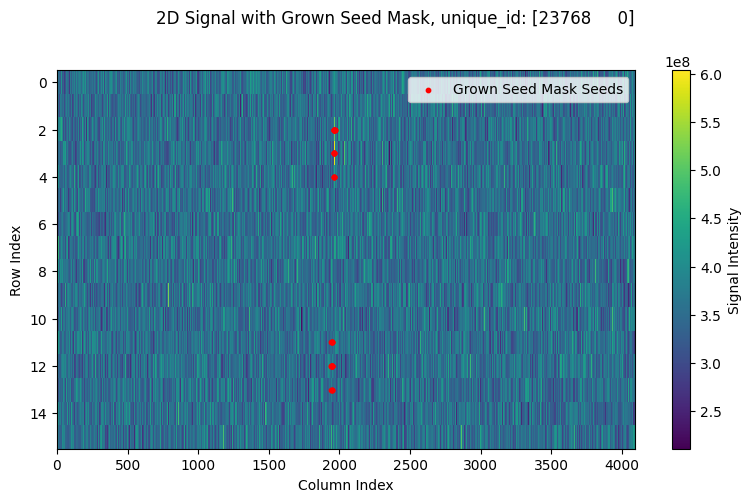

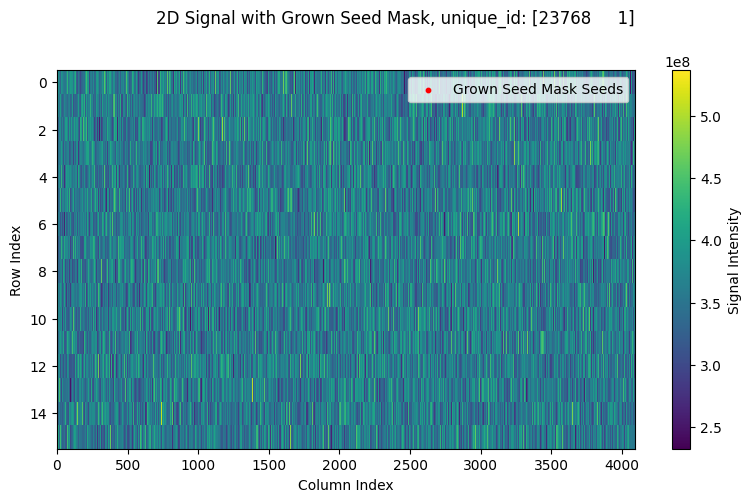

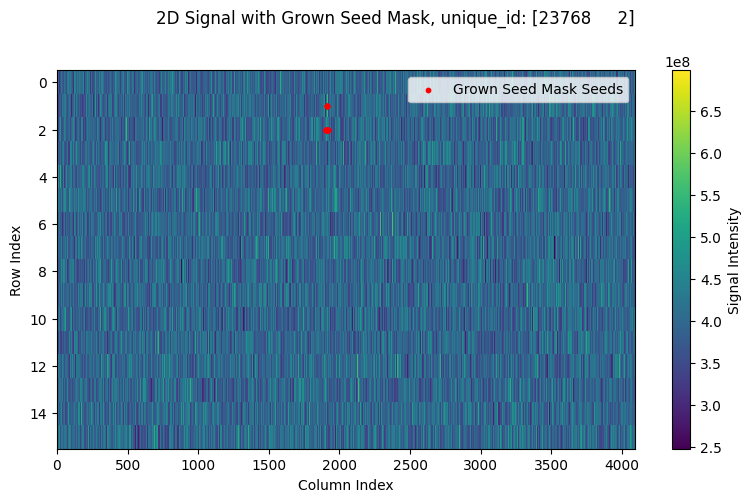

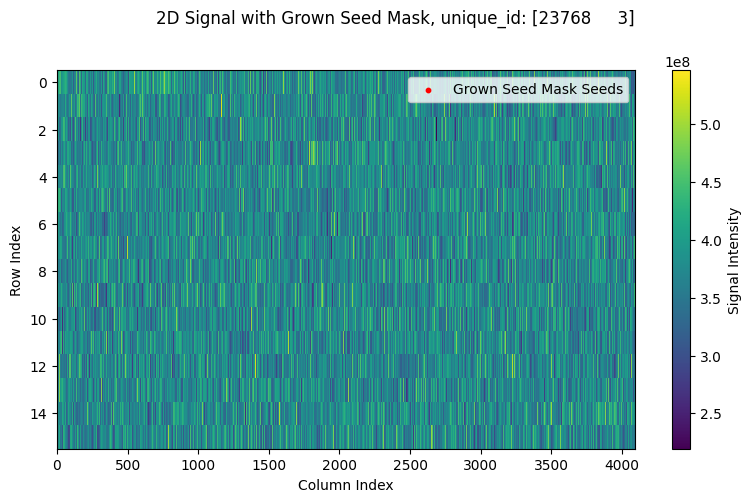

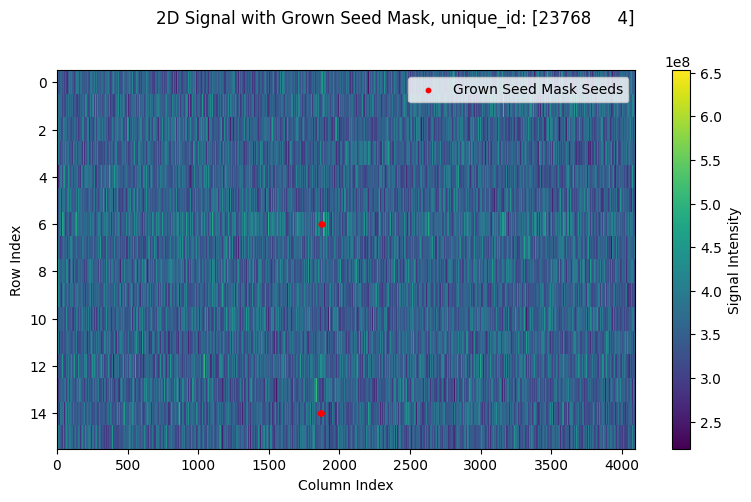

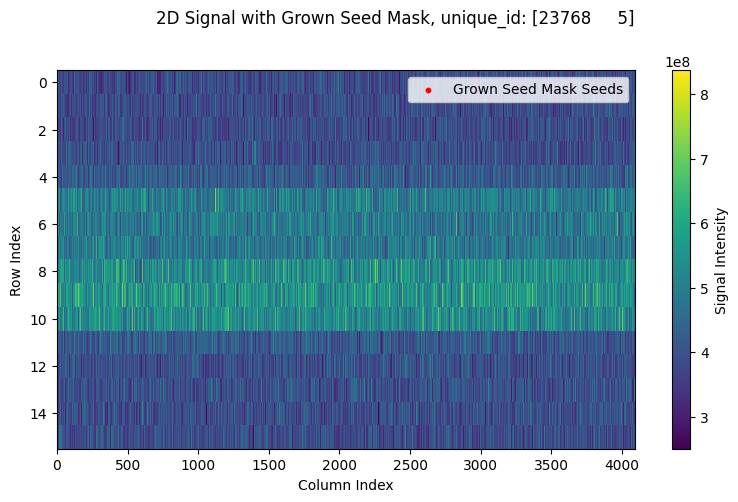

Now plotting signals for i=24729 with js=[0, 2, 4]
[1024.44842408 1024.44842691 1024.44842975 ... 1024.46002979 1024.46003263
 1024.46003546]


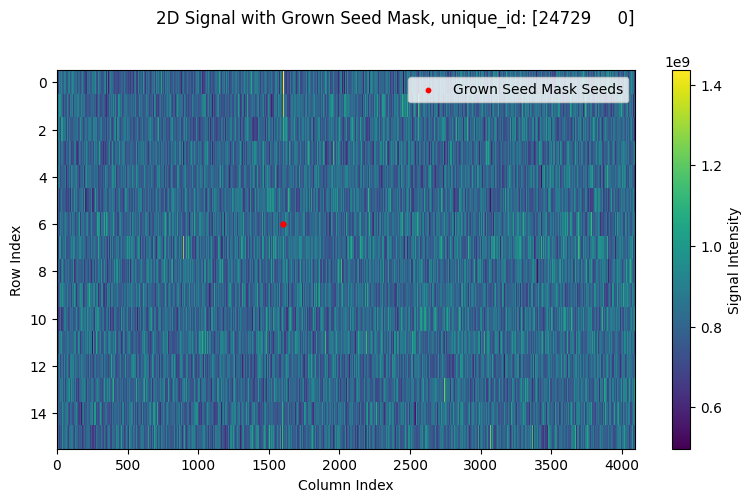

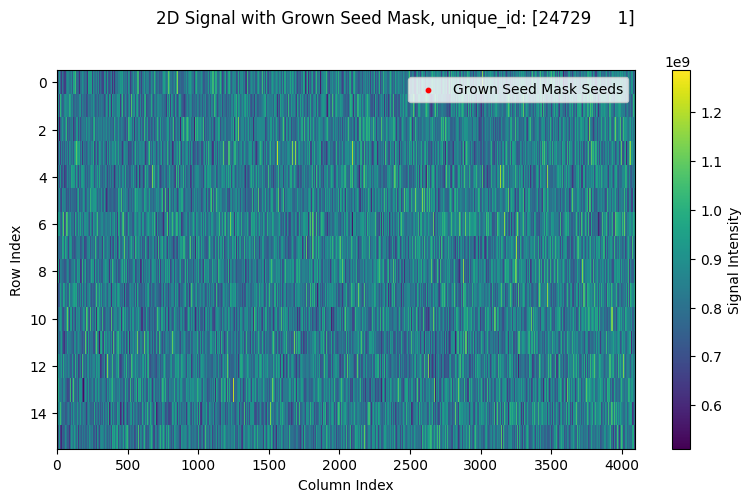

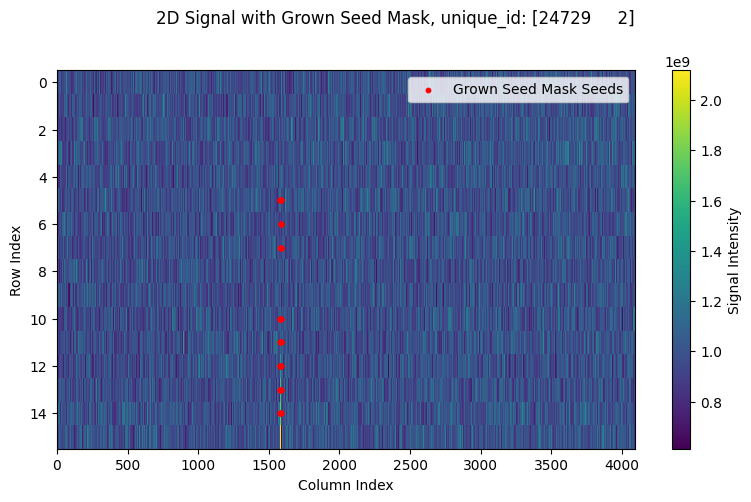

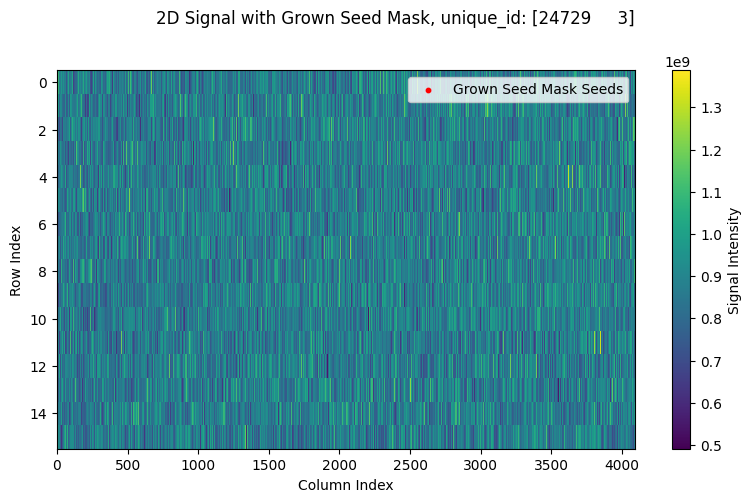

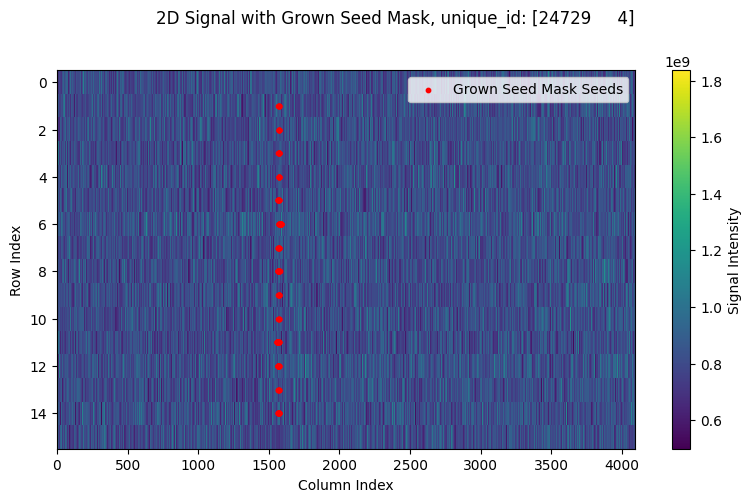

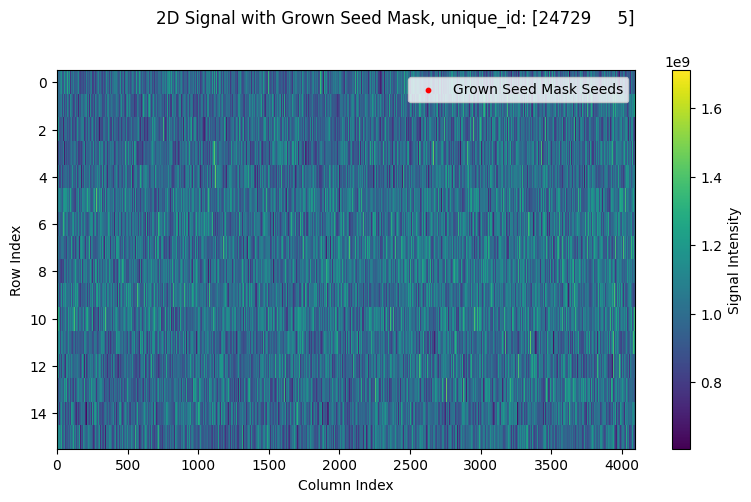

Now plotting signals for i=24817 with js=[0, 2, 4]
[1024.4600383  1024.46004113 1024.46004397 ... 1024.47164401 1024.47164685
 1024.47164968]


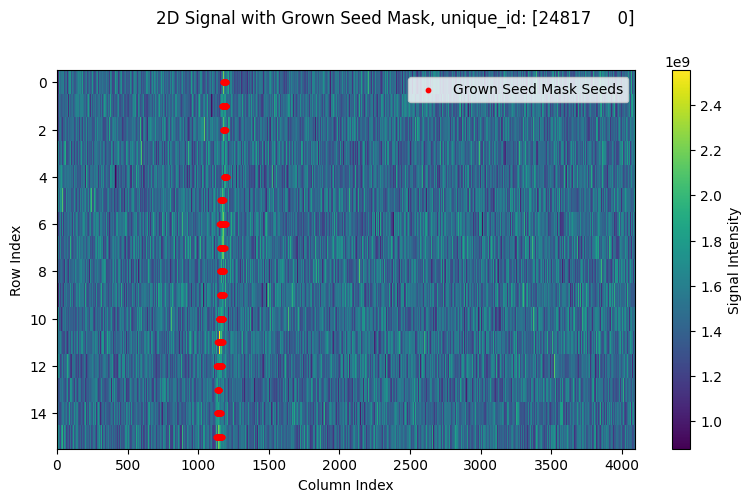

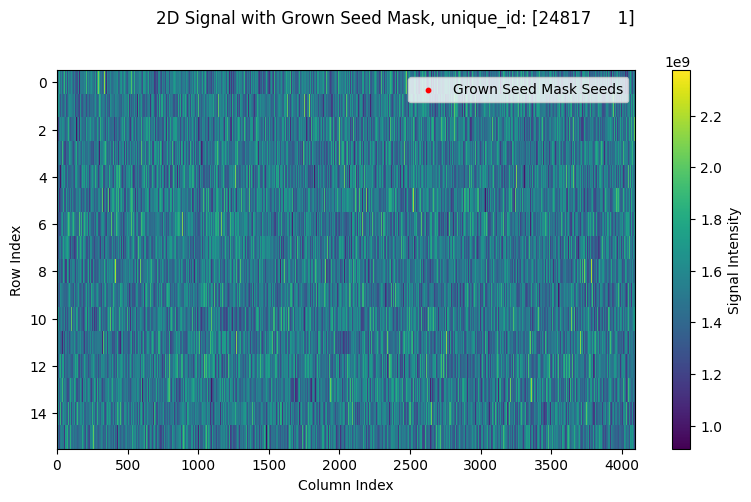

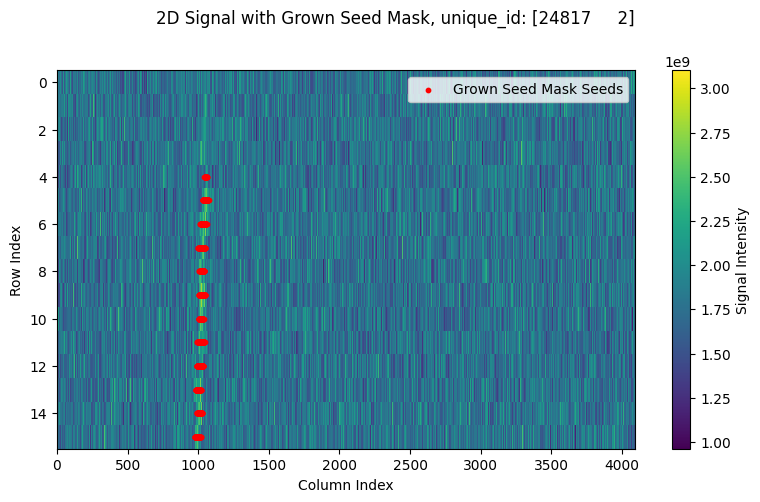

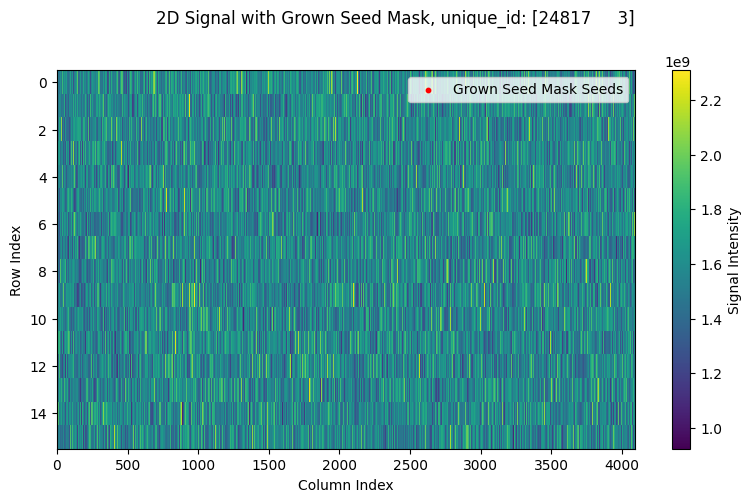

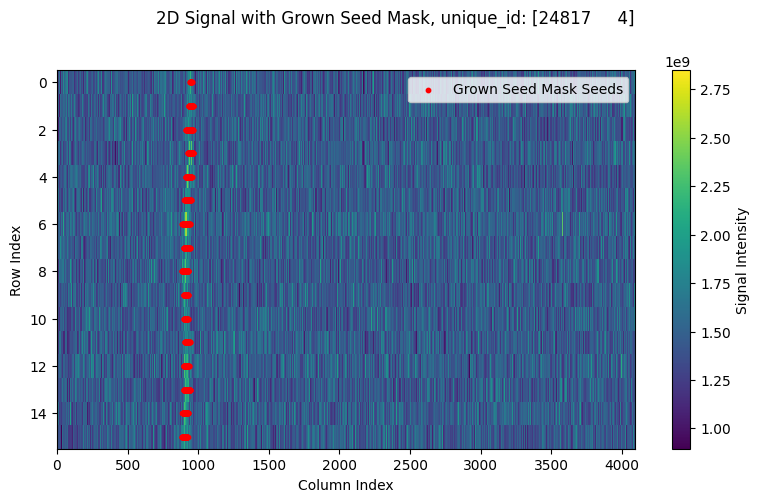

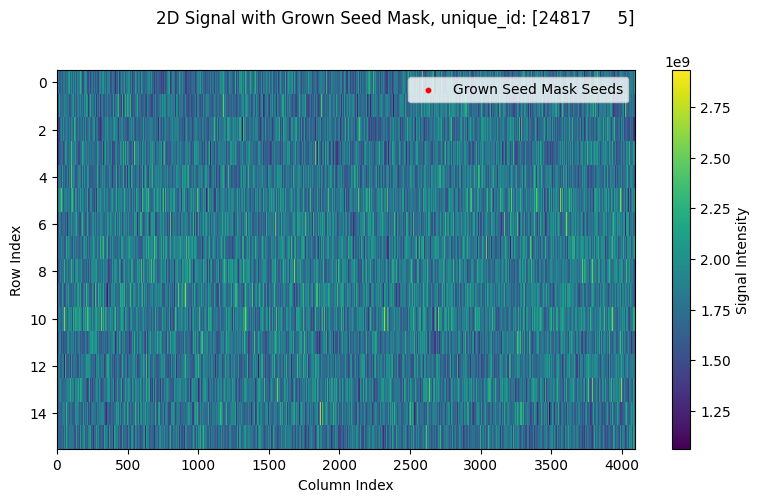

Now plotting signals for i=26744 with js=[0, 2, 4]
[1024.47165252 1024.47165536 1024.47165819 ... 1024.48325824 1024.48326107
 1024.48326391]


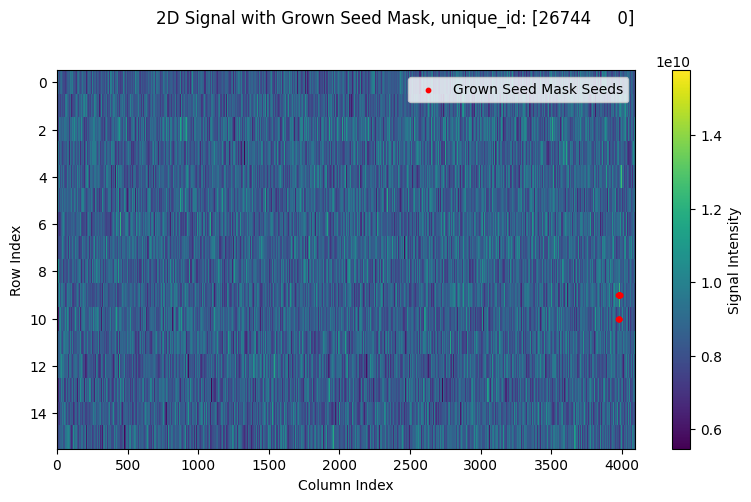

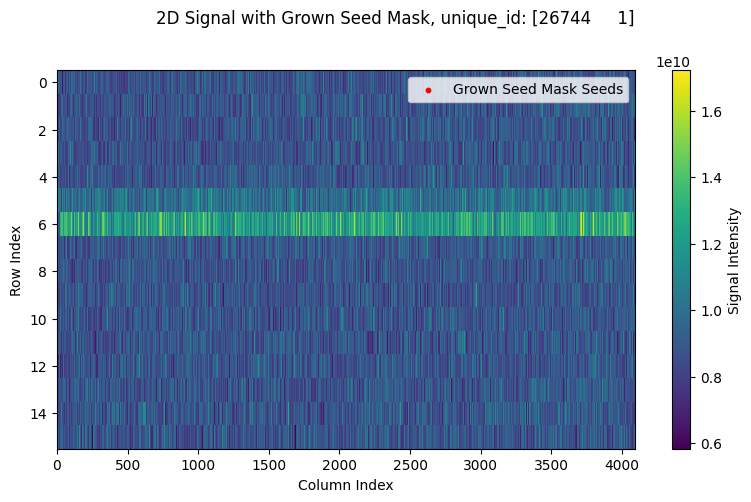

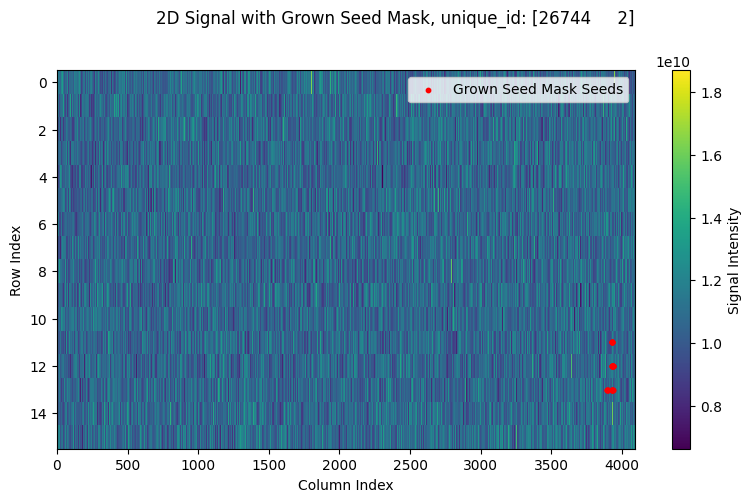

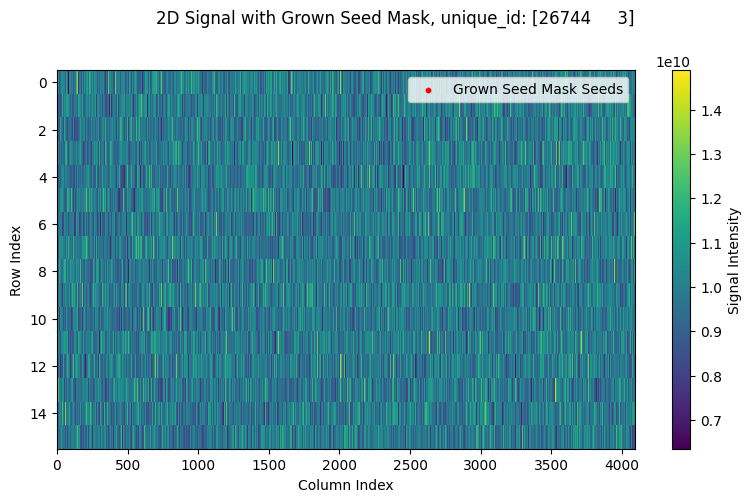

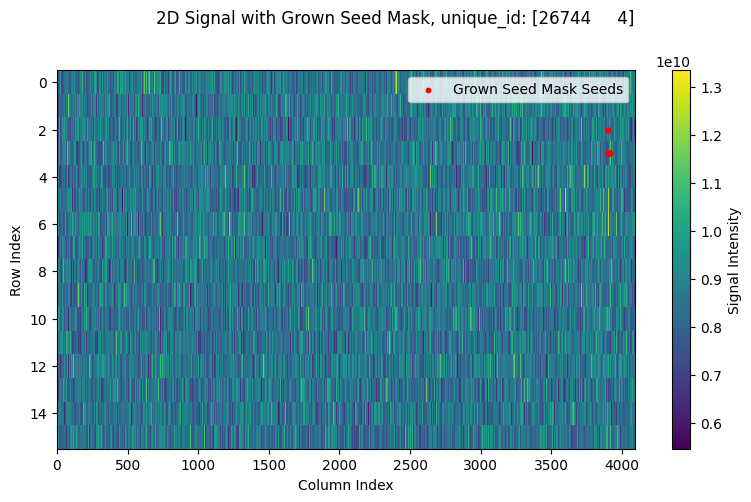

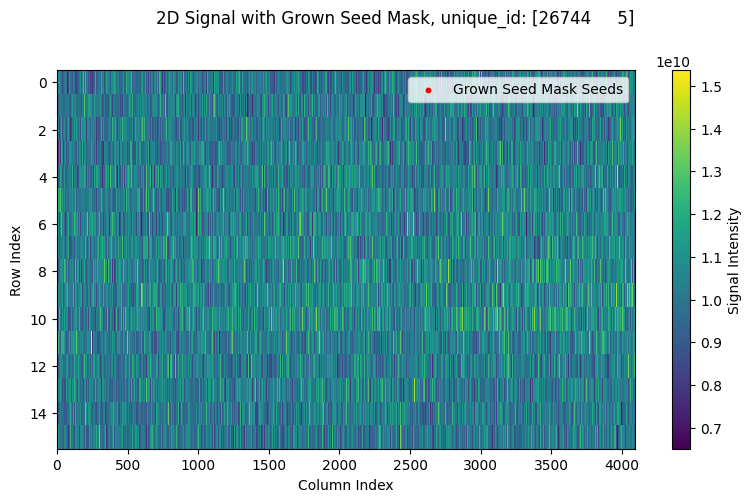

Now plotting signals for i=27553 with js=[0, 2, 4]
[1024.48326674 1024.48326958 1024.48327241 ... 1024.49487246 1024.49487529
 1024.49487813]


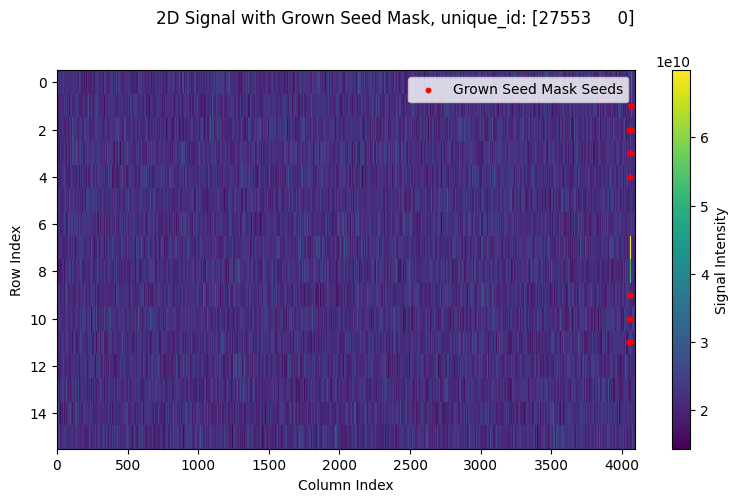

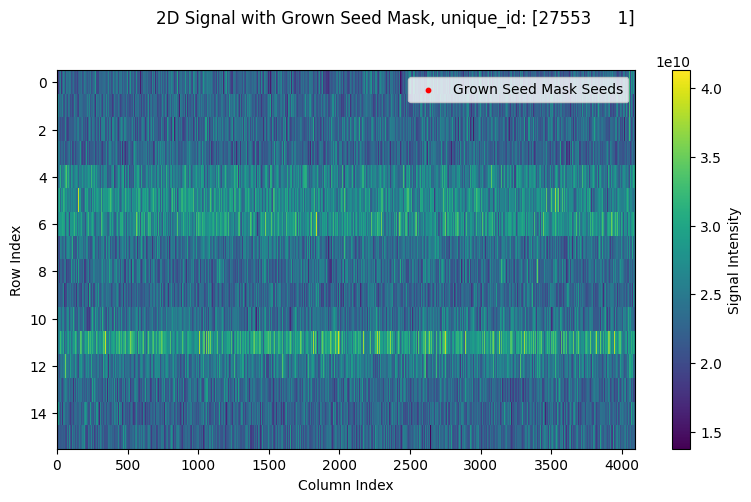

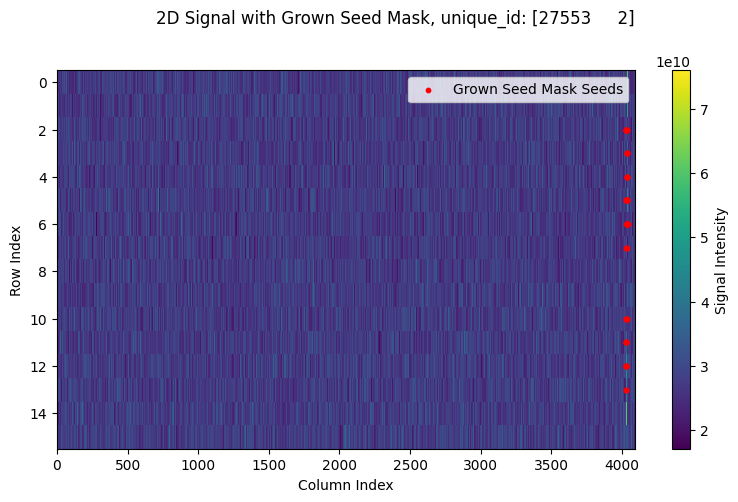

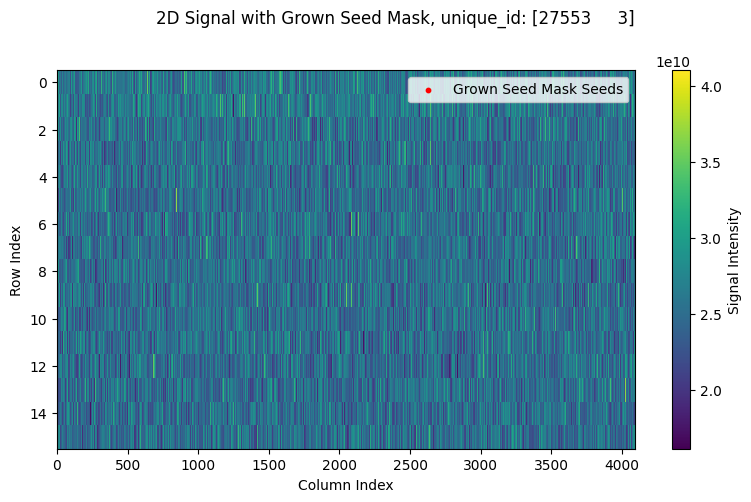

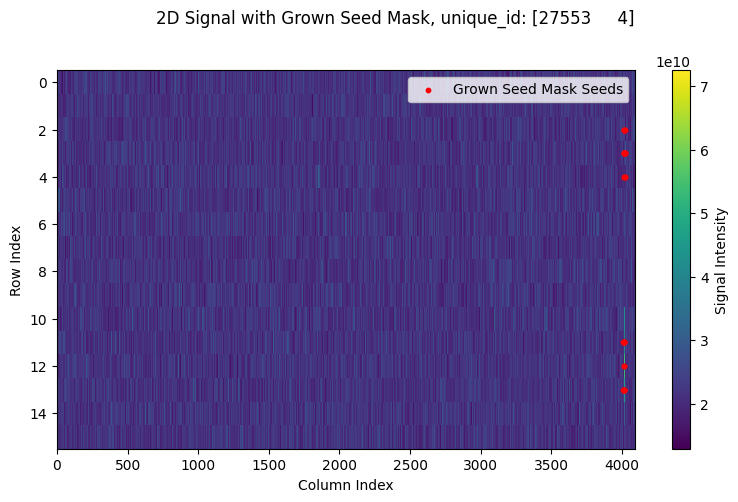

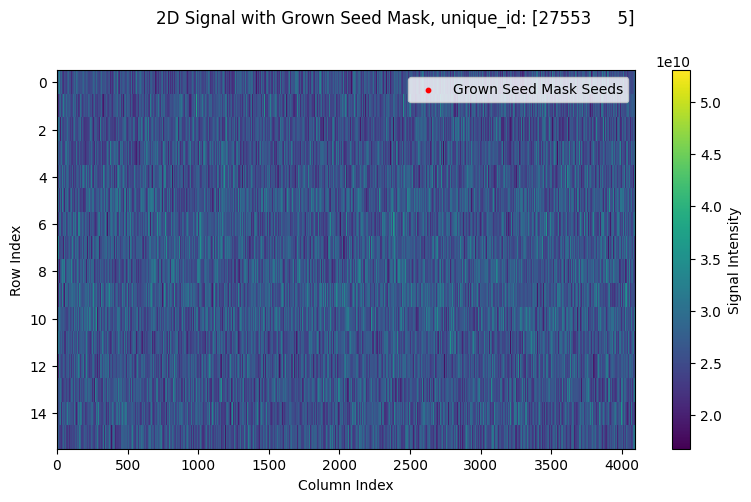

Now plotting signals for i=37761 with js=[0, 2, 4]
[1024.49488096 1024.4948838  1024.49488663 ... 1024.50648668 1024.50648951
 1024.50649235]


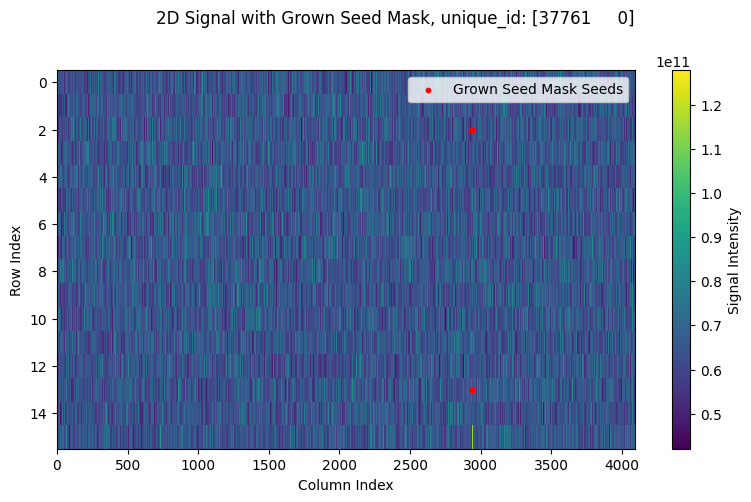

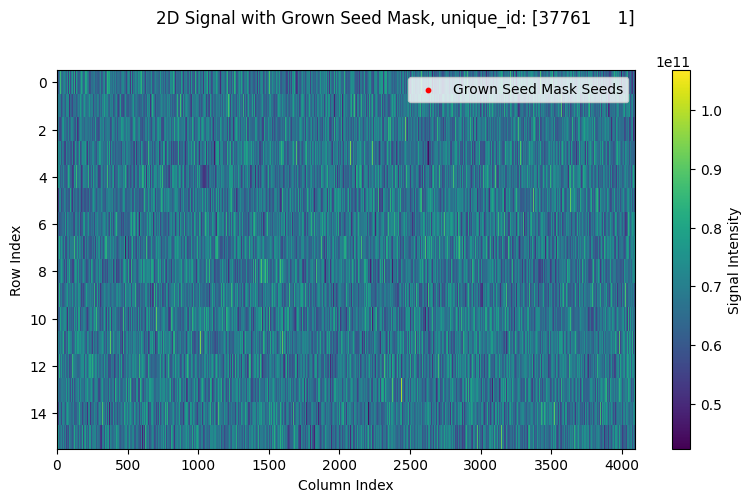

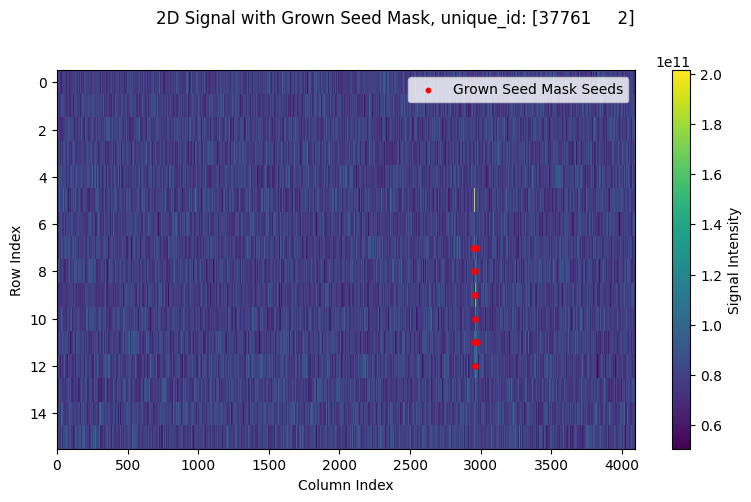

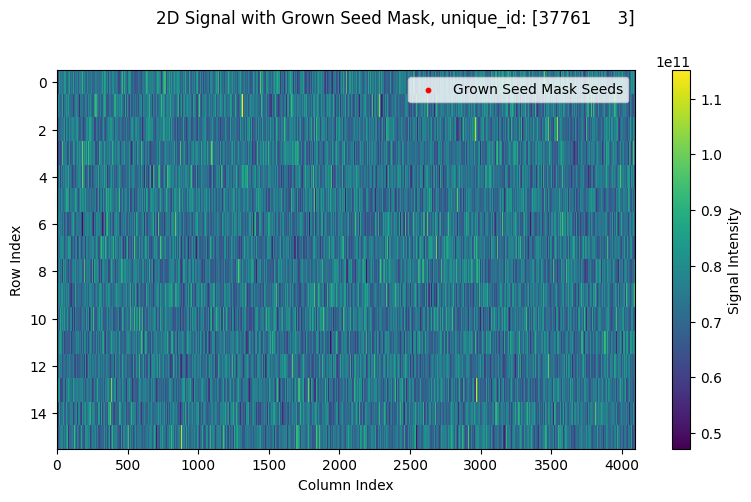

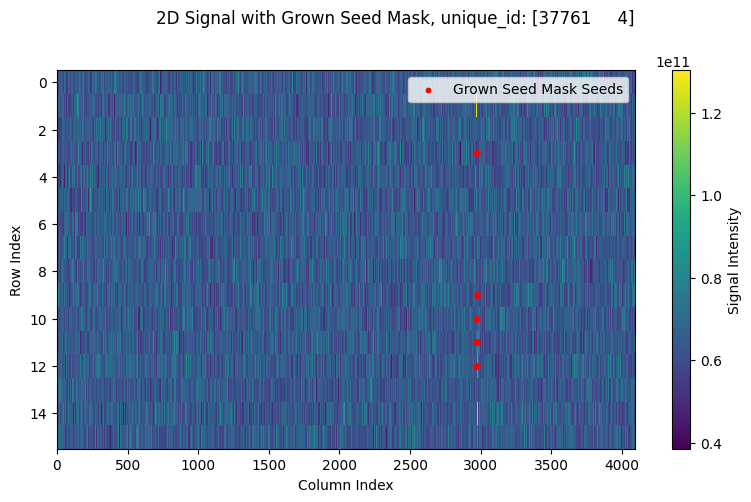

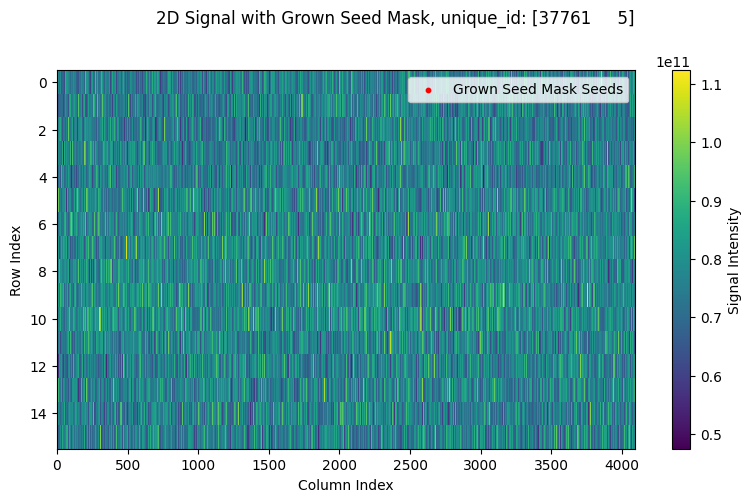

In [ ]:
index = 4824
# range_to_scan = 44:50
count = 44
for entry in triply_interesting_signals[44:50]:
    index = entry[0]
    print(f"Now plotting signals for i={index} with js={entry[1]}")
    print(frequencies[index])
    for signal in signal_instance_array[index]:
        if isinstance(signal, sd):
            # signal.plot_1D(
            #     mask_type="grown",
            #     save_location=None,
            #     show_plot_bool=True,
            # )
            signal.plot_2D(
                mask_type="grown",
                save_location=None,
                show_plot_bool=True,
            )
    count += 1

In [22]:
triply_interesting_signals[-3]

(24817, [0, 2, 4])

In [ ]:
frequencies

Now plotting signals for i=23768 with js=[0, 2, 4]


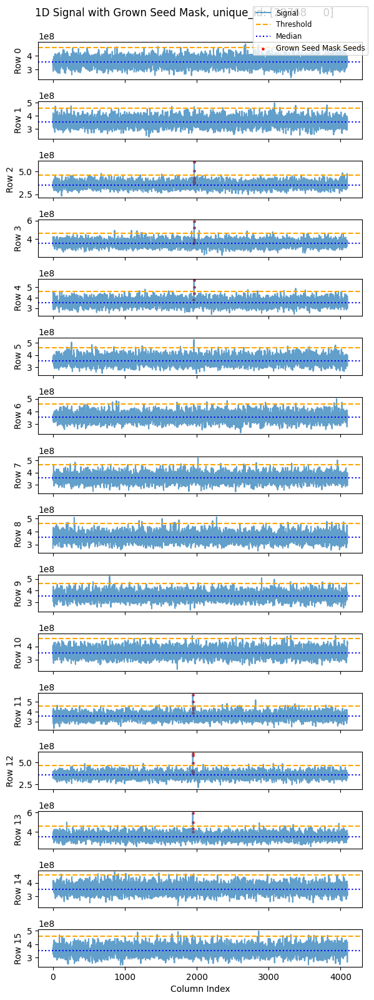

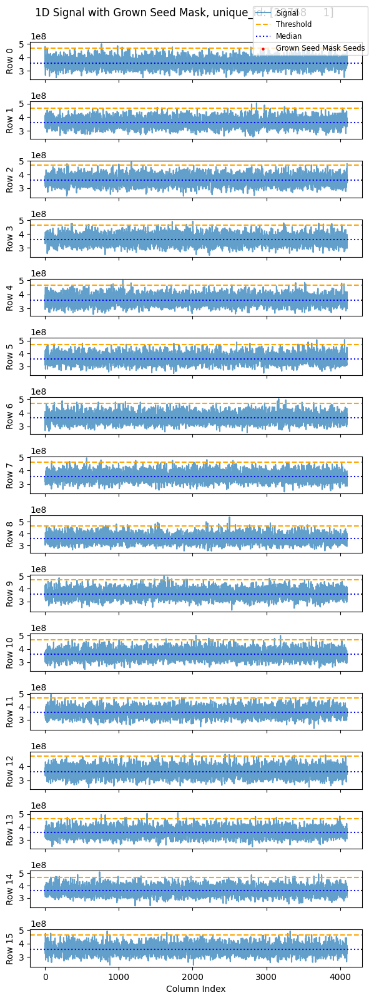

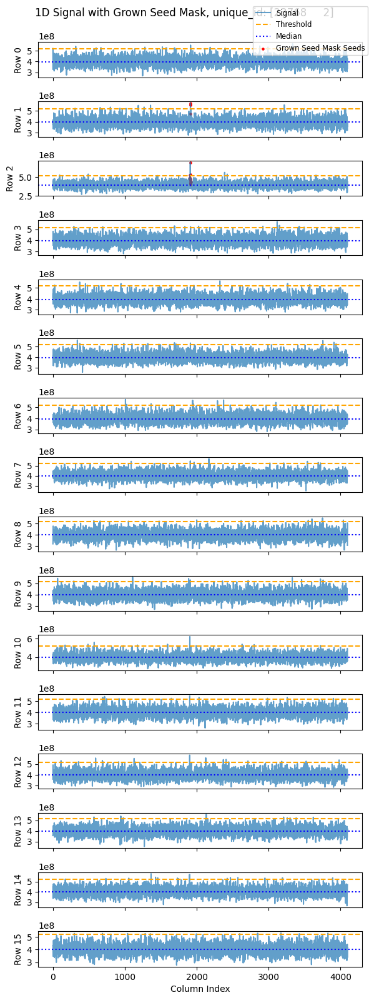

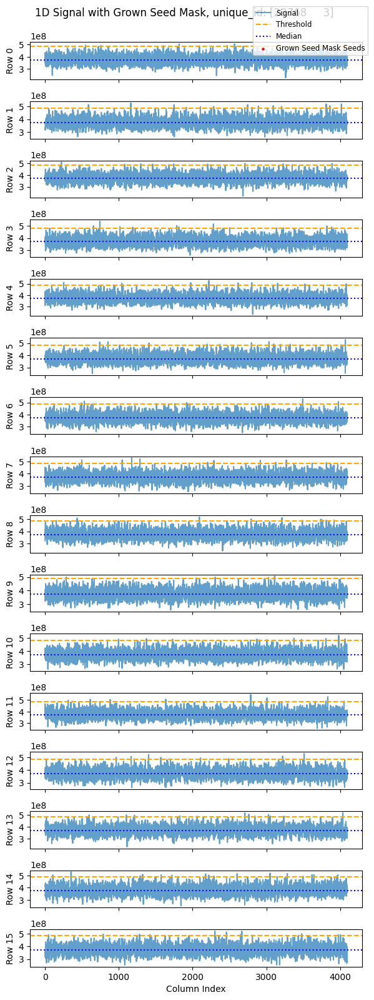

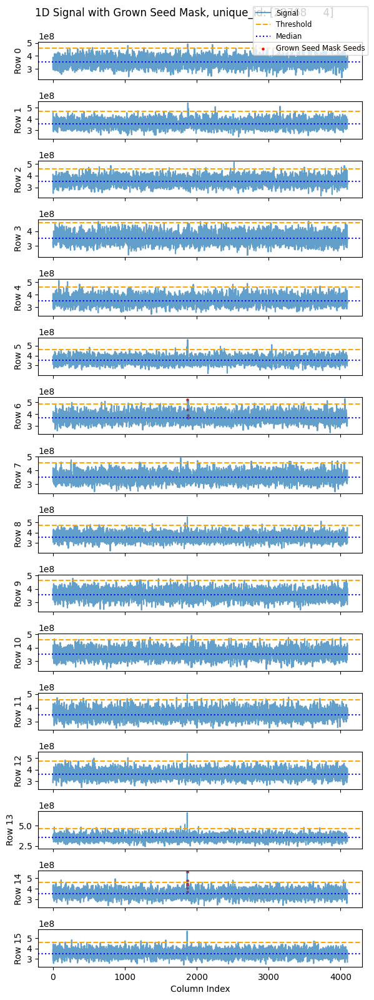

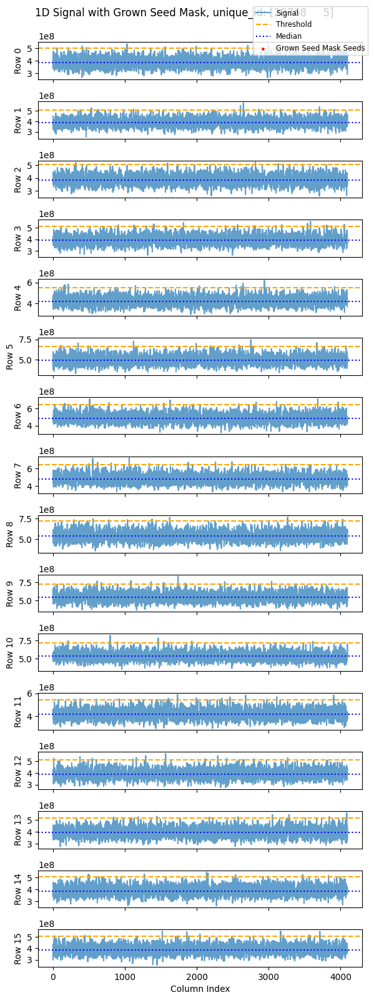

Now plotting signals for i=24729 with js=[0, 2, 4]


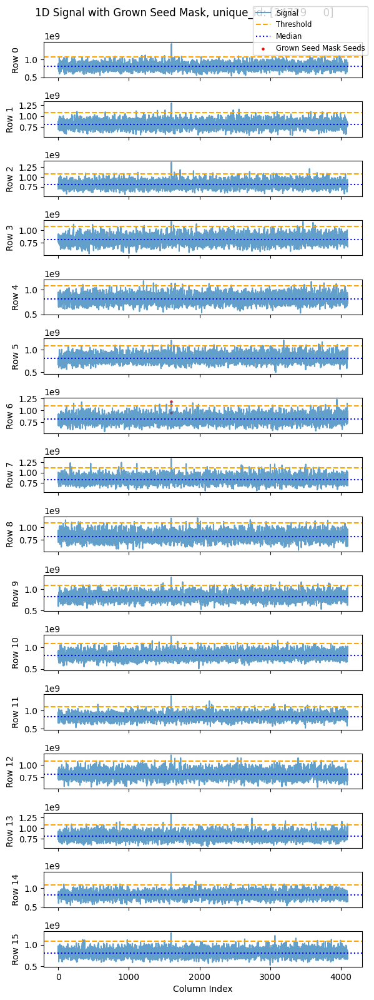

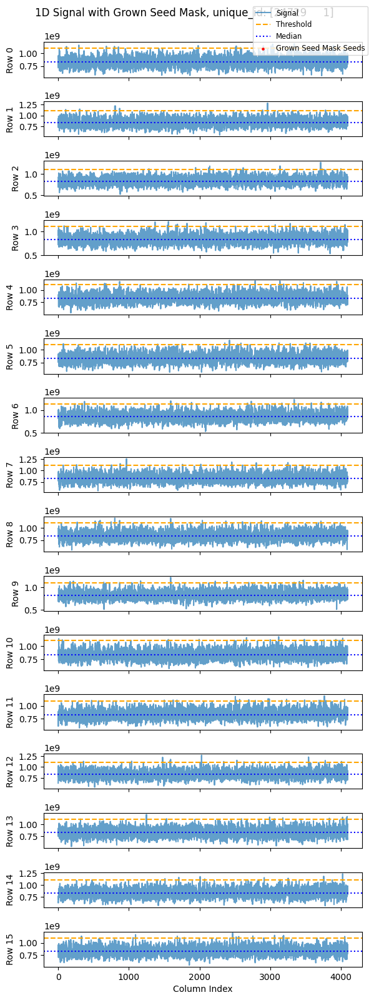

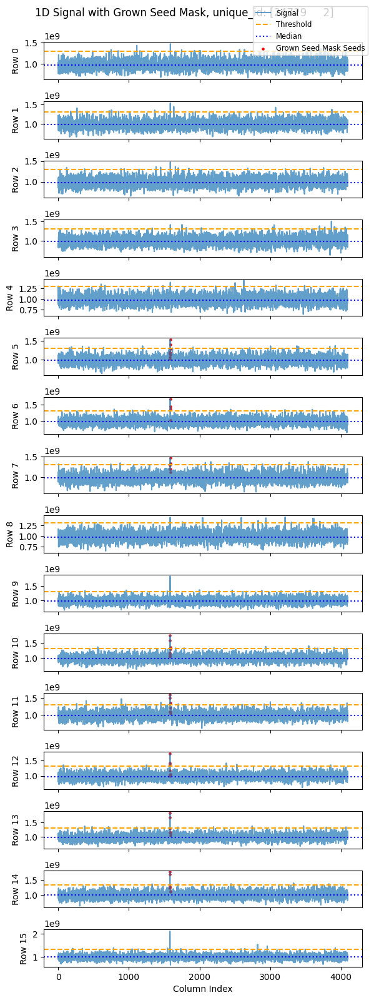

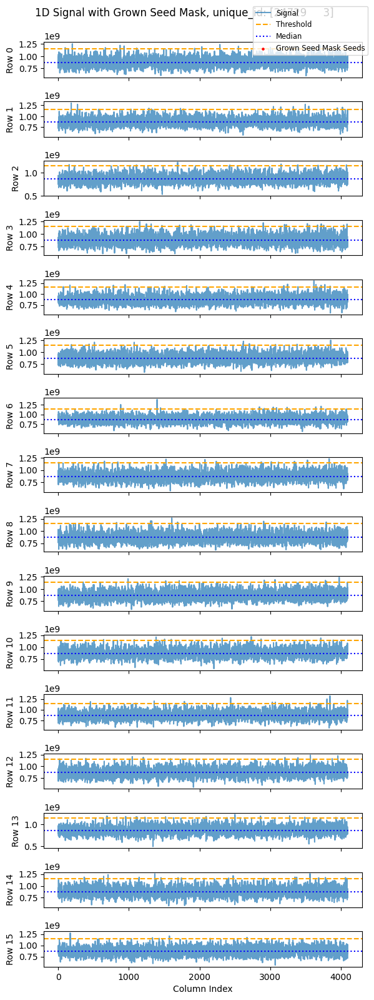

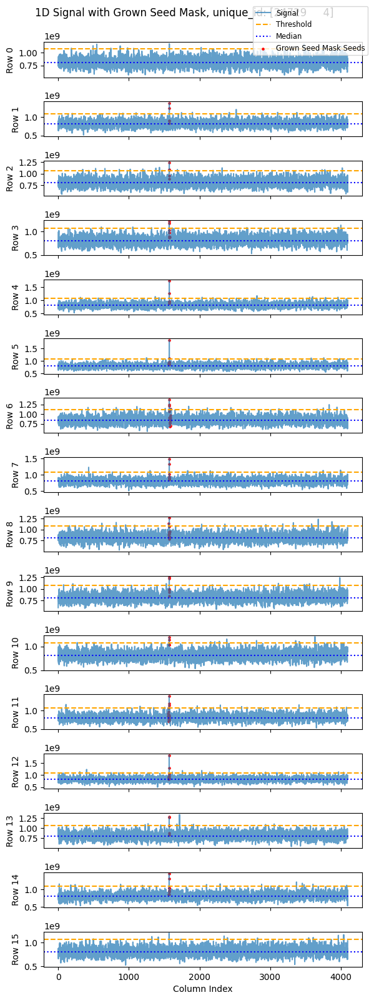

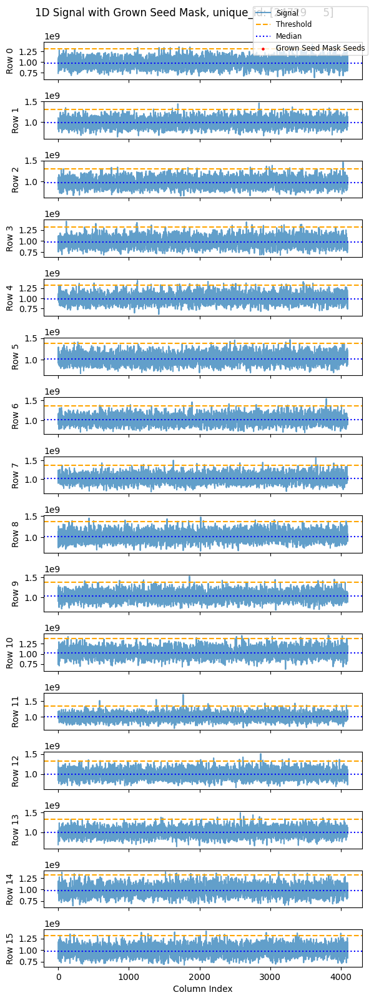

Now plotting signals for i=24817 with js=[0, 2, 4]


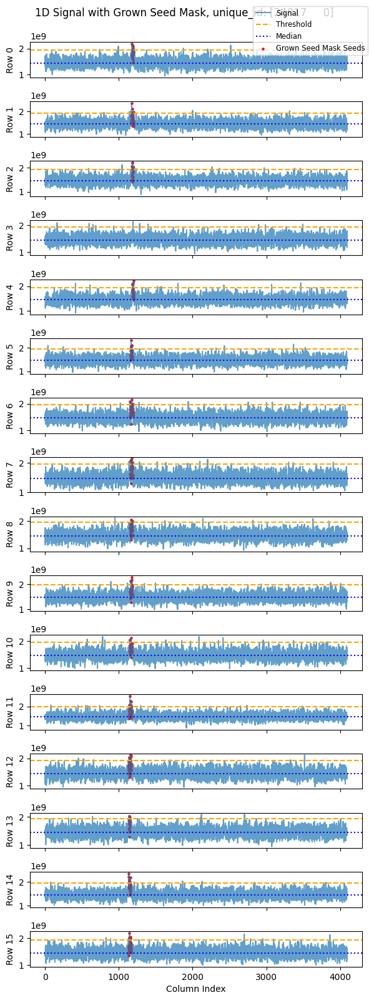

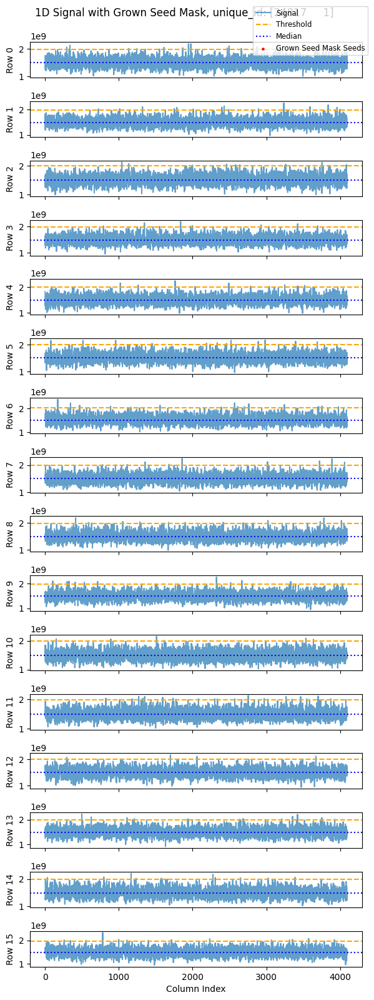

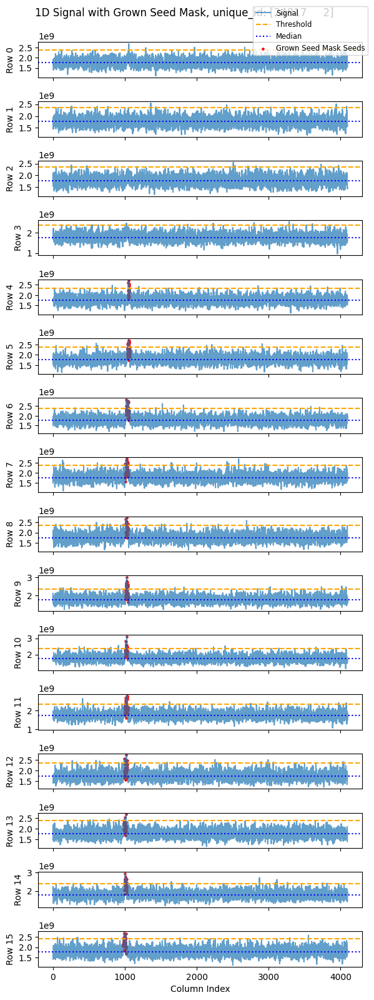

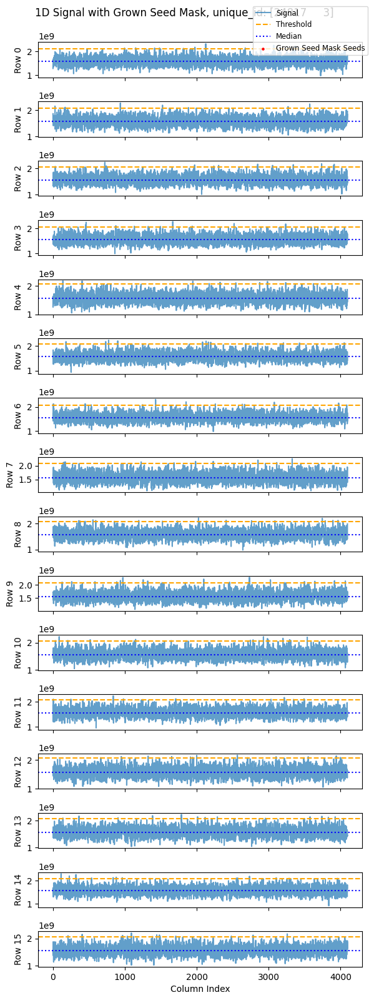

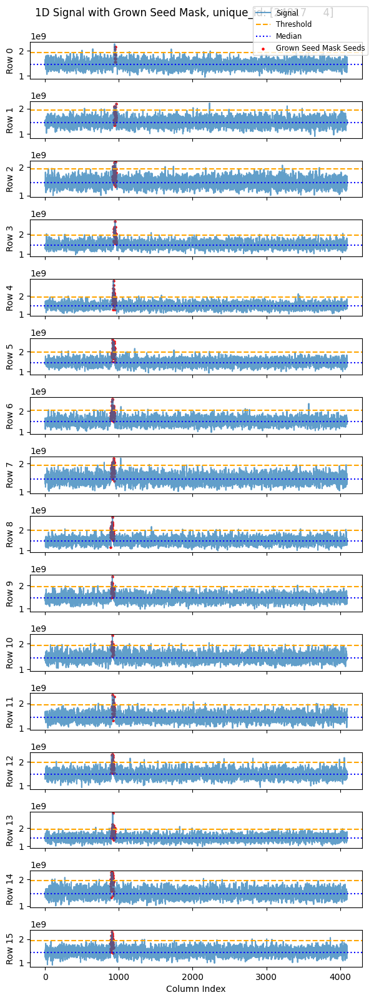

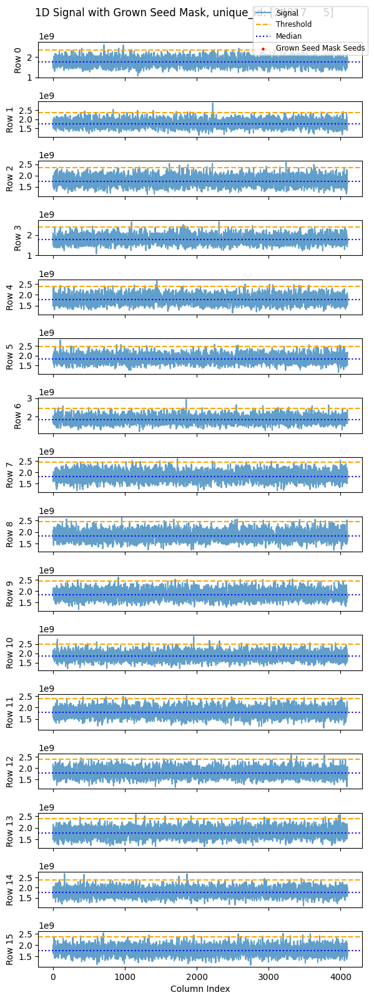

Now plotting signals for i=26744 with js=[0, 2, 4]


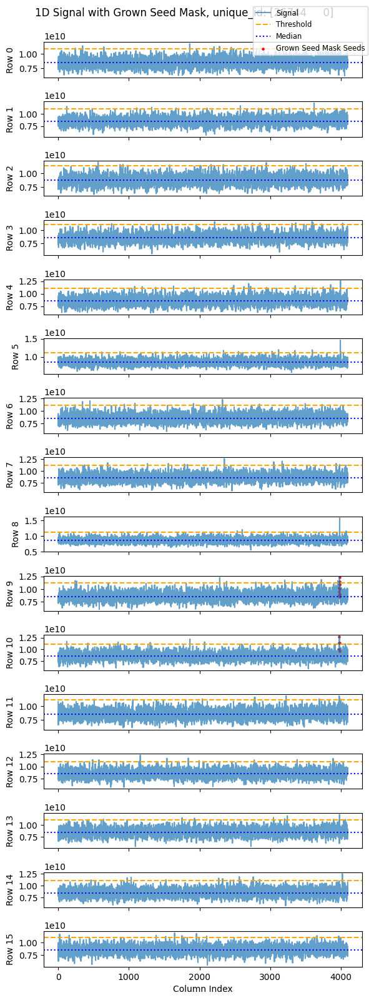

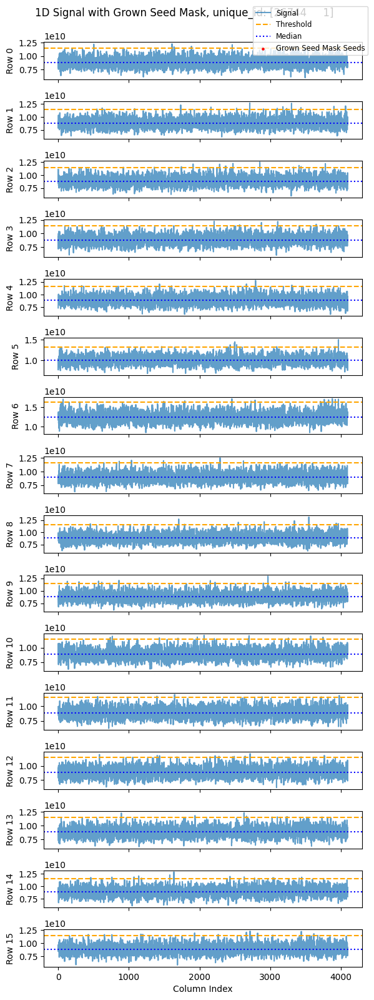

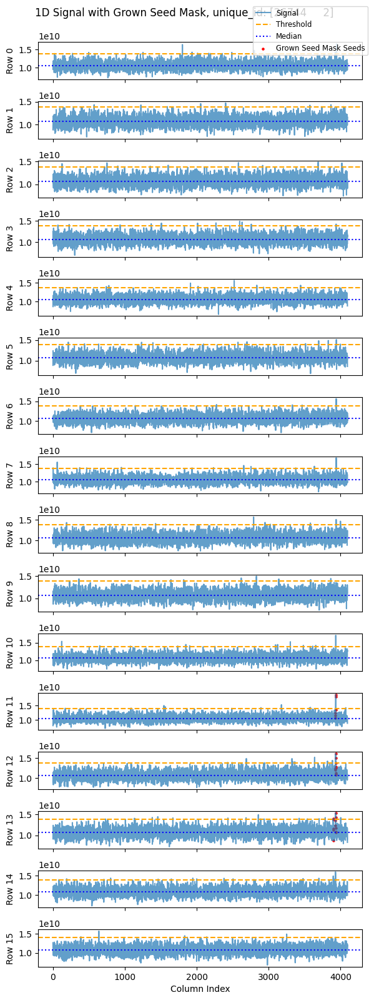

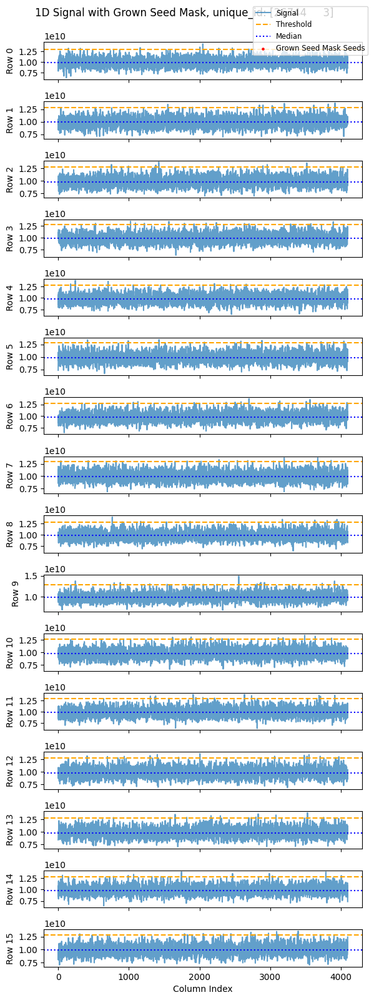

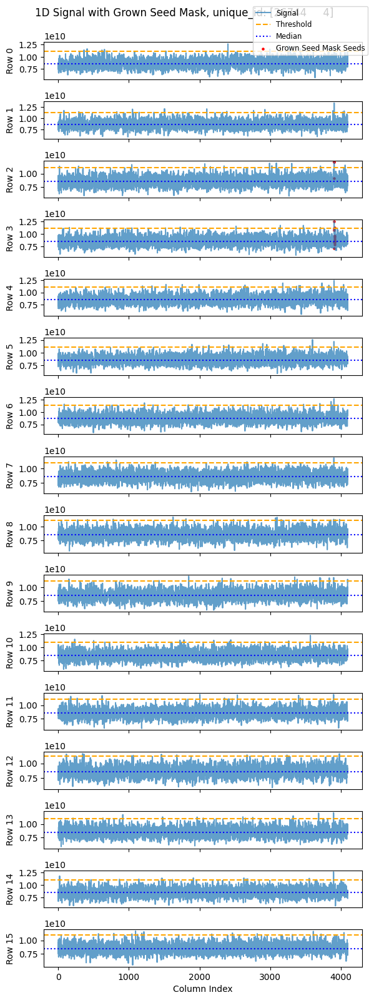

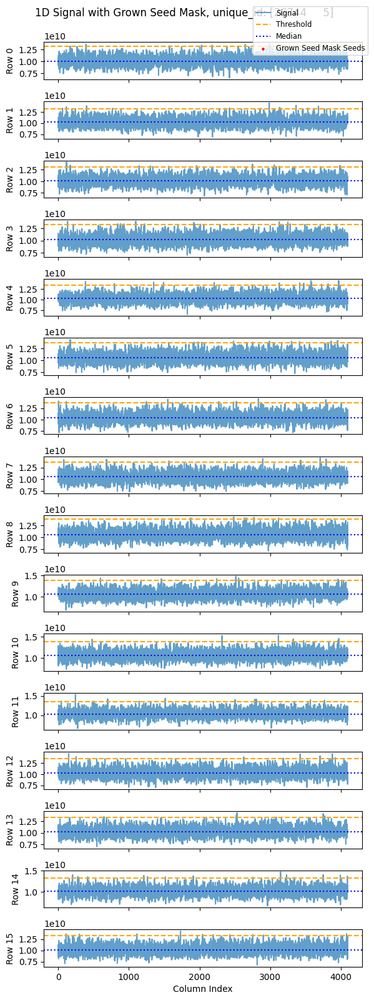

Now plotting signals for i=27553 with js=[0, 2, 4]


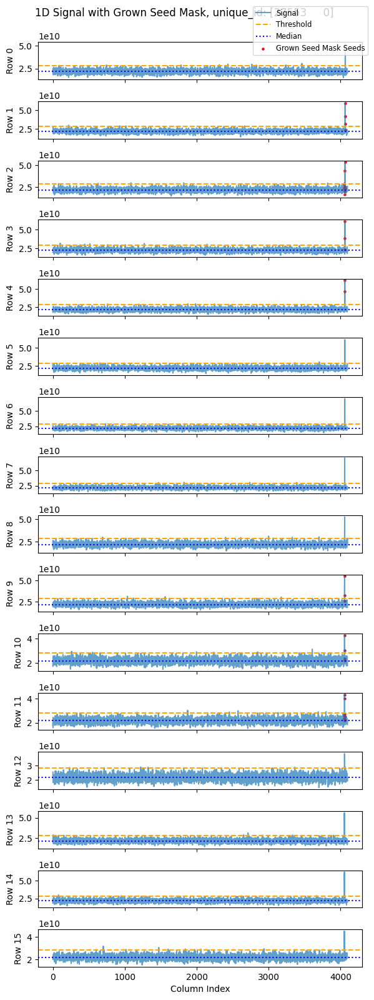

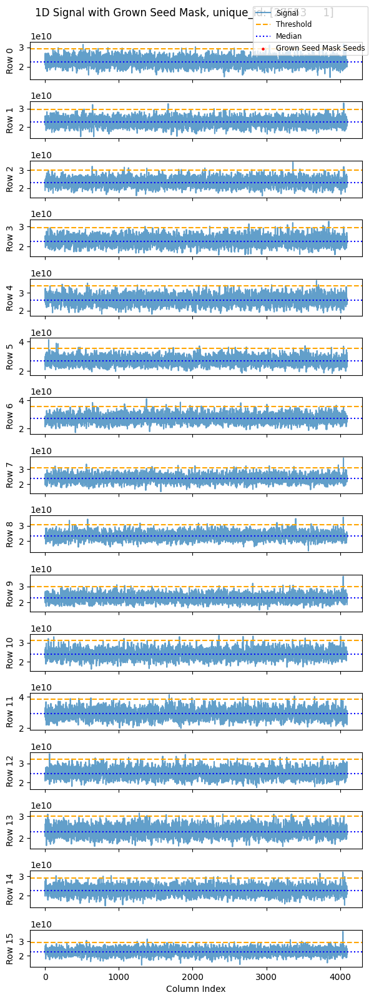

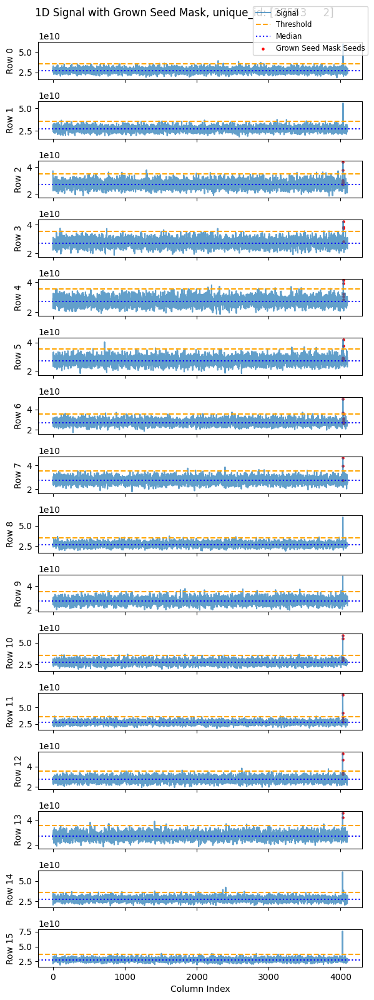

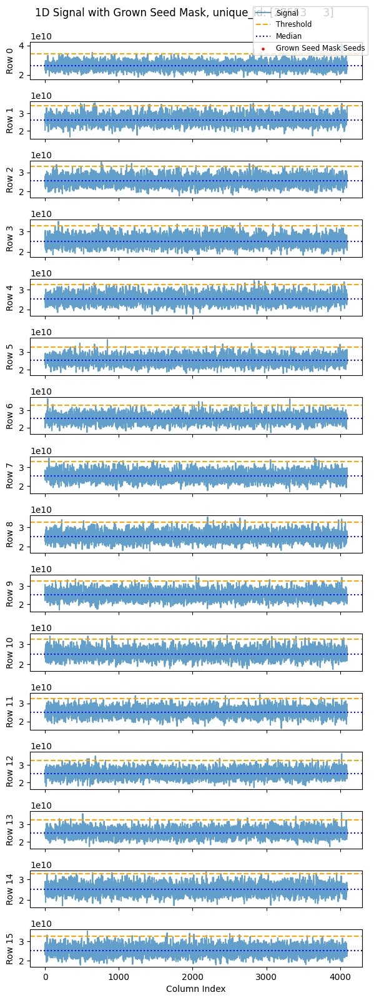

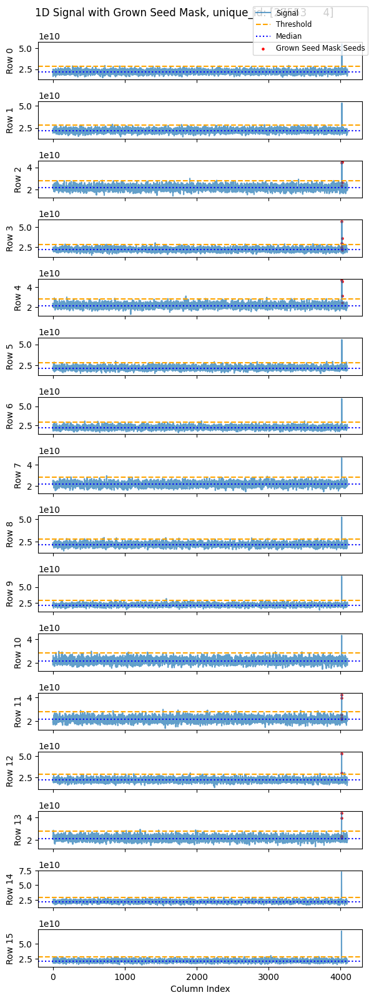

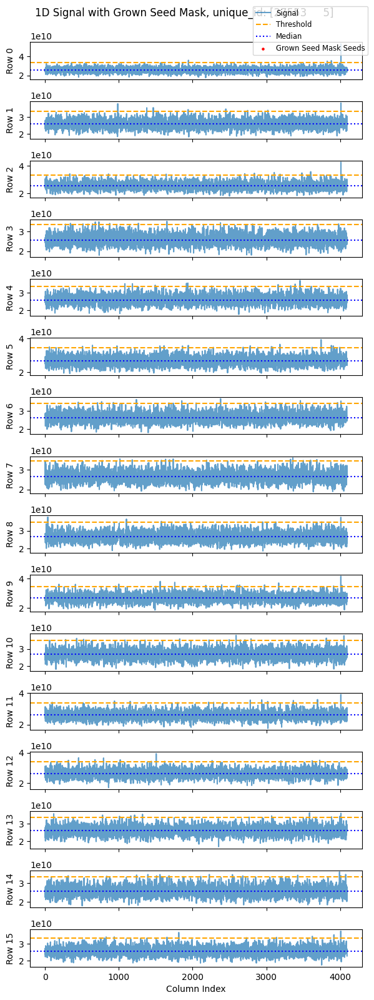

Now plotting signals for i=37761 with js=[0, 2, 4]


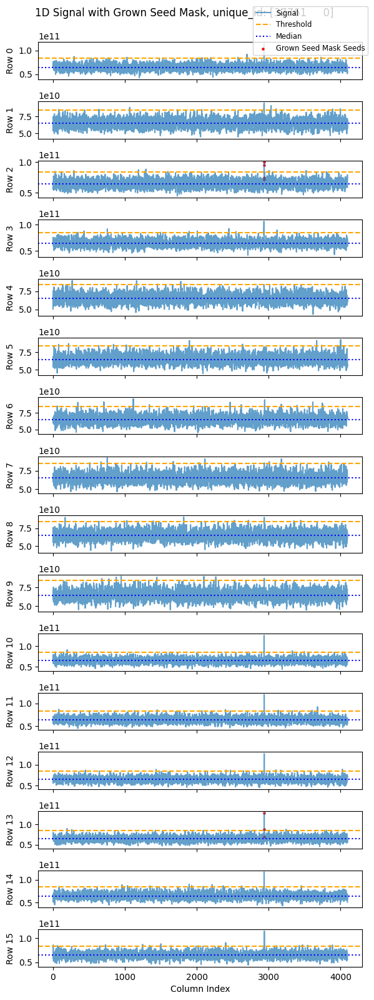

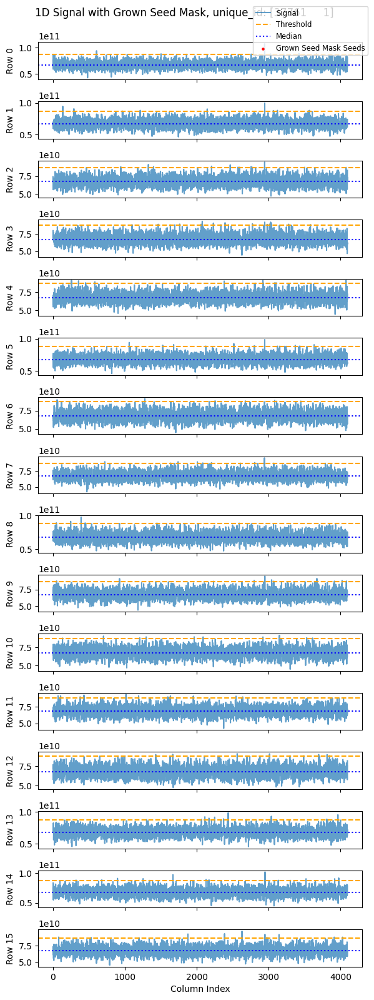

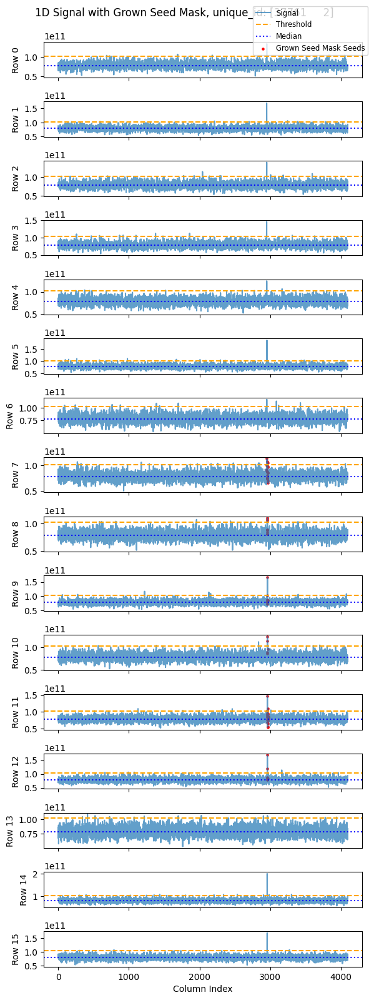

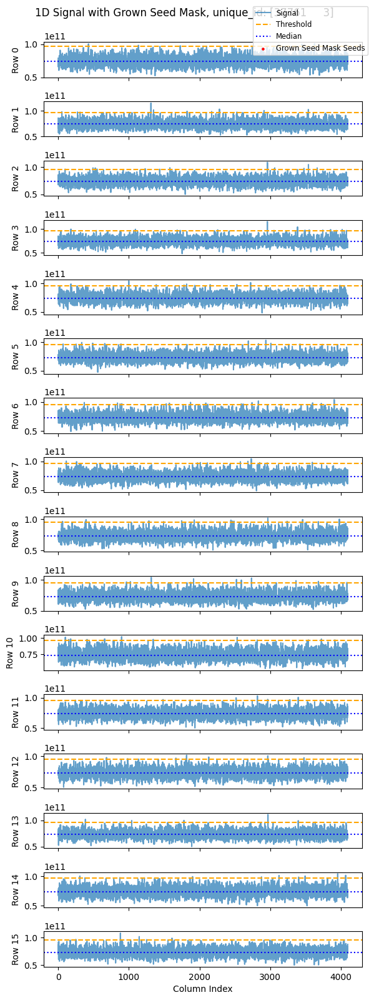

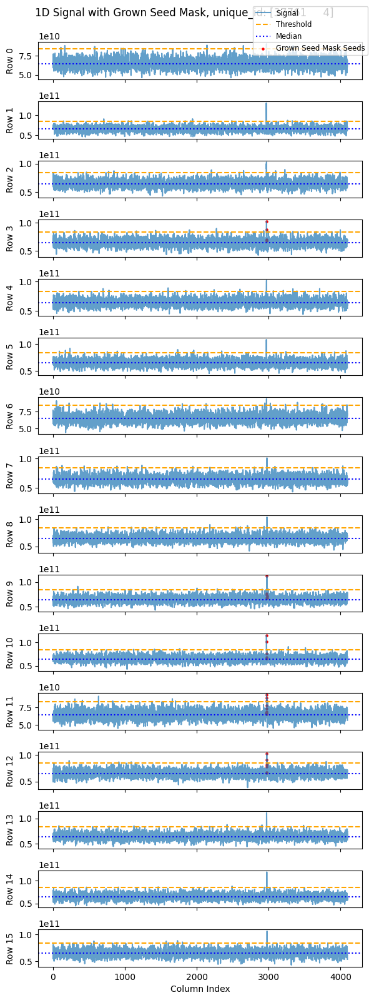

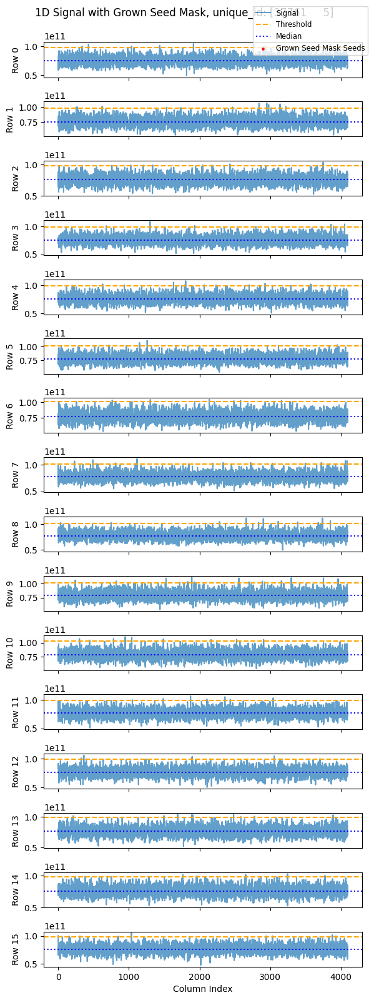

In [25]:
index = 4824
for entry in triply_interesting_signals[44:50]:
    index = entry[0]
    print(f"Now plotting signals for i={index} with js={entry[1]}")
    for signal in signal_instance_array[index]:
        if isinstance(signal, sd):
            signal.plot_1D(
                mask_type="grown",
                save_location=None,
                show_plot_bool=True,
            )
            # signal.plot_2D(
            #     mask_type="grown",
            #     save_location=None,
            #     show_plot_bool=True,
            # )

In [11]:
signal_instance = sd(
    testing_snippet, sigma_multiplier=3.0, unique_id=unique_id
)
signal_instance.compute_row_statistics()
signal_instance.get_seeds()
maximum_gap = 20

max_vertical_gap = 1
drift_padding_gap = 2
min_neighbours = 4

vertical_pruned_mask = signal_instance._prune_vertical(
    max_vertical_gap=max_vertical_gap,
    drift_padding_gap=maximum_gap,   
    min_neighbours=min_neighbours,
)


vertical_signal = signal_instance._return_signal_masked(vertical_pruned_mask)
print(f"{vertical_pruned_mask.sum()=}")

# fig, ax = plt.subplots(nrows=5, ncols=1, figsize=(8, 6))
# cax1 = ax[0].imshow(
#     signal_instance.signal_snippet, aspect="auto", cmap="viridis", interpolation="nearest"
# )
# fig.colorbar(
#     cax1, ax=ax[0], label="Signal Intensity"
# )  # colorbar for signal intensity
# ax[0].set_title("Original Signal Snippet")
horizontal_pruned_mask = signal_instance._prune_horizontal(
    max_horizontal_gap=maximum_gap
)

horizontal_signal = signal_instance._return_signal_masked(horizontal_pruned_mask)


merged_pruned_mask, hor_mask_2d, ver_mask_2d = signal_instance.prune_methods(
    gate_requirment_for_false="and",
    max_horizontal_gap=maximum_gap,
    max_vertical_gap=max_vertical_gap,
    drift_padding_gap=maximum_gap,
    min_neighbours=min_neighbours,
    return_masks=True,
)

print(f"{merged_pruned_mask.sum()=}")
print(f"{hor_mask_2d.sum()=}")
print(f"{ver_mask_2d.sum()=}")

pruned_signal = signal_instance._return_signal_masked(merged_pruned_mask)

# cax4 = ax[1].imshow(
#     pruned_signal, aspect="auto", cmap="viridis", interpolation="nearest"
# )
# fig.colorbar(
#     cax4, ax=ax[1], label="Pruned Seed Mask"
# )  # colorbar for signal intensity

# ax[1].set_title(f"Merged Pruned Seed Mask (AND)")


# consolidate seeds
consolidated_seeds = signal_instance.consolidate_seeds(
    max_pixel_distance_either_side=maximum_gap
)
print(f"{consolidated_seeds.sum()=}")
consolidated_signal = signal_instance._return_signal_masked(consolidated_seeds)
# cax5 = ax[2].imshow(
#     consolidated_signal, aspect="auto", cmap="viridis", interpolation="nearest"
# )
# fig.colorbar(
#     cax5, ax=ax[2], label="Consolidated Seed Mask"
# )  # colorbar for signal intensity
# ax[2].set_title(f"Consolidated Seed Mask (max_pixel_distance_either_side={maximum_gap})")
# # plot grown seeds

grown_seeds = signal_instance.grow_seeds(
    growth_threshold_above_median=0
)

grown_signal = signal_instance._return_signal_masked(grown_seeds)

print(f"{grown_seeds.sum()=}")
print(f"{grown_signal.sum()=}")
# cax6 = ax[3].imshow(
#     grown_signal, aspect="auto", cmap="viridis", interpolation="nearest"
# )

# fig.colorbar(
#     cax6, ax=ax[3], label="Grown Seed Signals"
# )  # colorbar for signal intensity
# ax[3].set_title(f"Grown Seed Mask (growth_threshold_above_median=1.0)")

# plot diff between grown seeds and initial signal

diff_signal = testing_snippet - grown_signal

# cax7 = ax[4].imshow(
#     diff_signal, aspect="auto", cmap="viridis", interpolation="nearest"
# )
# fig.colorbar(
#     cax7, ax=ax[4], label="Diff Signal"
# )  # colorbar for signal intensity
# ax[4].set_title(f"Diff between Original Signal and Grown Seed Signal")

print(f"diff between gronw seeds and consolidated seeds: {(grown_seeds != consolidated_seeds).sum()}")

plt.tight_layout()
plt.show()
plt.close()


################################################################################

# plot the consolidated seeds using plot_1D


# print("now plotting the consolidated seeds:")
# signal_instance.plot_1D(
#     mask_type="consolidated",
#     save_location=None,
#     show_plot_bool=True,
# )
# print("now plotting the grown seeds:")
# signal_instance.plot_1D(
#     mask_type="grown",
#     save_location=None,
#     show_plot_bool=True,
# )
# print("now plotting the consolidated seeds in 2D:")
# signal_instance.plot_2D(
#     mask_type="grown",
#     save_location=None,
#     show_plot_bool=True,
# )



vertical_pruned_mask.sum()=np.int64(0)
merged_pruned_mask.sum()=np.int64(0)
hor_mask_2d.sum()=np.int64(33)
ver_mask_2d.sum()=np.int64(0)


IndexError: index 0 is out of bounds for axis 0 with size 0

vertical_pruned_mask.sum()=np.int64(0)
merged_pruned_mask.sum()=np.int64(0)
hor_mask_2d.sum()=np.int64(33)
ver_mask_2d.sum()=np.int64(0)


IndexError: index 0 is out of bounds for axis 0 with size 0

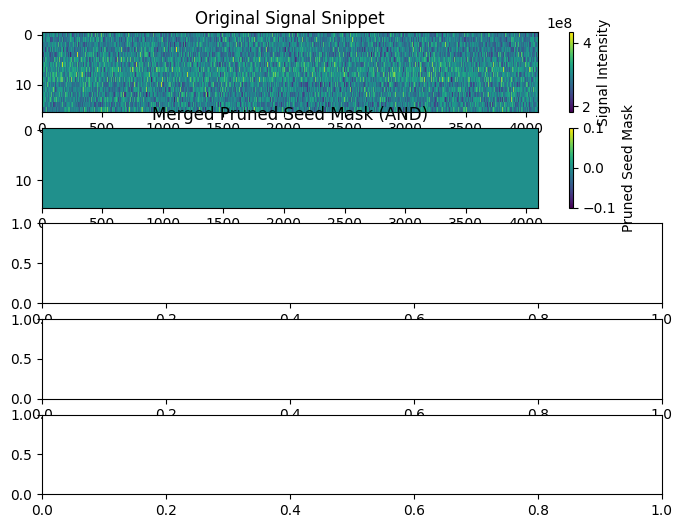

In [10]:
signal_instance = sd(
    testing_snippet, sigma_multiplier=3.0, unique_id=unique_id
)
signal_instance.compute_row_statistics()
signal_instance.get_seeds()
maximum_gap = 20

max_vertical_gap = 1
drift_padding_gap = 2
min_neighbours = 4

vertical_pruned_mask = signal_instance._prune_vertical(
    max_vertical_gap=max_vertical_gap,
    drift_padding_gap=maximum_gap,   
    min_neighbours=min_neighbours,
)

vertical_signal = signal_instance._return_signal_masked(vertical_pruned_mask)
print(f"{vertical_pruned_mask.sum()=}")

fig, ax = plt.subplots(nrows=5, ncols=1, figsize=(8, 6))
cax1 = ax[0].imshow(
    signal_instance.signal_snippet, aspect="auto", cmap="viridis", interpolation="nearest"
)
fig.colorbar(
    cax1, ax=ax[0], label="Signal Intensity"
)  # colorbar for signal intensity
ax[0].set_title("Original Signal Snippet")
# cax2 = ax[1].imshow(
#     vertical_signal, aspect="auto", cmap="viridis", interpolation="nearest"
# )
# fig.colorbar(
#     cax2, ax=ax[1], label="Pruned Seed Mask"
# )  # colorbar for signal intensity
# ax[1].set_title(f"Vertically Pruned Seed Mask (min_neighbours={min_neighbours})")
# plt.tight_layout()
# plt.show()

# merge horizontal and vertical pruning


################################################################################

horizontal_pruned_mask = signal_instance._prune_horizontal(
    max_horizontal_gap=maximum_gap
)

horizontal_signal = signal_instance._return_signal_masked(horizontal_pruned_mask)

# print(f"{horizontal_pruned_mask.sum()=}")
# cax3 = ax[2].imshow(
#     horizontal_signal, aspect="auto", cmap="viridis", interpolation="nearest"
# )
# fig.colorbar(
#     cax3, ax=ax[2], label="Pruned Seed Mask"
# )  # colorbar for signal intensity
# ax[2].set_title(f"Horizontally Pruned Seed Mask (max_horizontal_gap={maximum_gap})")


################################################################################

merged_pruned_mask, hor_mask_2d, ver_mask_2d = signal_instance.prune_methods(
    gate_requirment_for_false="and",
    max_horizontal_gap=maximum_gap,
    max_vertical_gap=max_vertical_gap,
    drift_padding_gap=maximum_gap,
    min_neighbours=min_neighbours,
    return_masks=True,
)

print(f"{merged_pruned_mask.sum()=}")
print(f"{hor_mask_2d.sum()=}")
print(f"{ver_mask_2d.sum()=}")

pruned_signal = signal_instance._return_signal_masked(merged_pruned_mask)

cax4 = ax[1].imshow(
    pruned_signal, aspect="auto", cmap="viridis", interpolation="nearest"
)
fig.colorbar(
    cax4, ax=ax[1], label="Pruned Seed Mask"
)  # colorbar for signal intensity

ax[1].set_title(f"Merged Pruned Seed Mask (AND)")


# consolidate seeds
consolidated_seeds = signal_instance.consolidate_seeds(
    max_pixel_distance_either_side=maximum_gap
)
print(f"{consolidated_seeds.sum()=}")
consolidated_signal = signal_instance._return_signal_masked(consolidated_seeds)
cax5 = ax[2].imshow(
    consolidated_signal, aspect="auto", cmap="viridis", interpolation="nearest"
)
fig.colorbar(
    cax5, ax=ax[2], label="Consolidated Seed Mask"
)  # colorbar for signal intensity
ax[2].set_title(f"Consolidated Seed Mask (max_pixel_distance_either_side={maximum_gap})")
# plot grown seeds

grown_seeds = signal_instance.grow_seeds(
    growth_threshold_above_median=0
)

grown_signal = signal_instance._return_signal_masked(grown_seeds)

print(f"{grown_seeds.sum()=}")
print(f"{grown_signal.sum()=}")
cax6 = ax[3].imshow(
    grown_signal, aspect="auto", cmap="viridis", interpolation="nearest"
)

fig.colorbar(
    cax6, ax=ax[3], label="Grown Seed Signals"
)  # colorbar for signal intensity
ax[3].set_title(f"Grown Seed Mask (growth_threshold_above_median=1.0)")

# plot diff between grown seeds and initial signal

diff_signal = testing_snippet - grown_signal

cax7 = ax[4].imshow(
    diff_signal, aspect="auto", cmap="viridis", interpolation="nearest"
)
fig.colorbar(
    cax7, ax=ax[4], label="Diff Signal"
)  # colorbar for signal intensity
ax[4].set_title(f"Diff between Original Signal and Grown Seed Signal")

print(f"diff between gronw seeds and consolidated seeds: {(grown_seeds != consolidated_seeds).sum()}")

plt.tight_layout()
plt.show()
plt.close()


################################################################################

# plot the consolidated seeds using plot_1D


print("now plotting the consolidated seeds:")
signal_instance.plot_1D(
    mask_type="consolidated",
    save_location=None,
    show_plot_bool=True,
)
print("now plotting the grown seeds:")
signal_instance.plot_1D(
    mask_type="grown",
    save_location=None,
    show_plot_bool=True,
)
print("now plotting the consolidated seeds in 2D:")
signal_instance.plot_2D(
    mask_type="grown",
    save_location=None,
    show_plot_bool=True,
)














# signal_instance.consolidate_seeds(max_pixel_distance_either_side=maximum_gap)

# consolidated, shape = signal_instance._return_consolidated_mask()
# print(f"{consolidated=}")
# print(f"{shape=}")
# print(f"{consolidated.sum()=}")

# plot initial seeds
# signal_instance.plot_1D(
#     nothing_initial_or_consolidated="consolidated",
#     save_location=None,
#     show_plot_bool=True,
# )
# # plot on 2d
# signal_instance.plot_2D(
#     nothing_initial_or_consolidated="consolidated",
#     save_location=None,
#     show_plot_bool=True,
# )

# print(f"{test_dataset.shape=}, {test_labels.shape=}, {test_signal_only.shape=}")
# print(f"{test_labels[0:10]=}")
# fig, axs = plt.subplots(nrows= 2, ncols=2, figsize=(10, 6))
# for i in range(2):
#     axs[i,0].imshow(test_dataset[i], cmap='viridis', aspect='auto')
#     axs[i,1].imshow(test_signal_only[i], cmap='viridis', aspect='auto')
#     axs[i,0].set_ylabel(f"Snippet {i}")
#     axs[i,0].set_xlabel("Column Index")
#     # add subtitles
#     axs[i,1].set_xlabel(f"Column Index for label {test_labels[i]}, unique_id: {id_pairs[i]}")
# axs[0,0].set_title("Raw Data")
# axs[0,1].set_title("Signal Only Data")

# plt.tight_layout()
# plt.show()
